# Cargar Datos 

In [1]:
# Importamos las Librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cx_Oracle

In [2]:
# coexion Oracle
ip = '127.0.0.1'
puerto = '1521'
SID = 'xe'

dns_tns = cx_Oracle.makedsn(ip, puerto, SID)

conexion = cx_Oracle.connect('curso', 'curso3657', dns_tns)

In [3]:
# cargar datos con dias de la semana
dataset = pd.read_sql('select * from curso.Dataset_Proyecto_Final', con=conexion)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


In [4]:
# cargar datos
data = pd.read_sql('select * from curso.datos_proyectofinal', con=conexion)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


In [5]:
#convetir los datos a fecha
data['FECHA'] = pd.to_datetime(data['FECHA'], format = "%Y-%m-%d")

In [6]:
#convetir los datos a fecha
dataset['FECHA'] = pd.to_datetime(dataset['FECHA'], format = "%Y-%m-%d")

In [7]:
# mostrar datos con dias de la semana
dataset.head()

,DIA,FECHA,H1,H2,H3,H4,H5,H6,H7,H8,...,H17,H18,H19,H20,H21,H22,H23,H24,TOTAL,DEMANDA_MAXIMA
0,Martes,2018-02-13,763.60,721.90,695.38,686.69,683.46,696.48,637.370,683.468,...,791.540,808.704,968.36,1149.32,1145.91,1076.40,950.99,841.88,19474.979,1154.42
1,Miércoles,2018-02-14,753.88,714.55,687.93,673.69,681.22,718.95,822.160,862.930,...,1143.944,1116.402,1190.74,1339.03,1322.66,1238.36,1116.12,978.34,23847.679,1340.14
2,Jueves,2018-02-15,875.21,817.26,796.85,777.89,785.04,820.46,910.198,966.106,...,1206.766,1169.578,1287.95,1420.80,1400.74,1310.73,1160.41,1020.04,26122.294,1421.98
3,Viernes,2018-02-16,913.26,867.75,836.12,818.72,815.80,859.70,959.426,1016.900,...,1172.958,1153.826,1264.13,1354.74,1331.84,1225.94,1097.76,981.20,26012.200,1360.30
4,Sábado,2018-02-17,884.47,841.19,812.13,802.44,799.27,830.30,809.170,907.994,...,1029.388,1011.410,1130.52,1317.74,1294.38,1222.84,1102.31,978.69,24090.781,1319.68


# Modelo ARIMA (media móvil integrada autorregresiva)

In [8]:
!pip install pmdarima --quiet

In [9]:
from pmdarima import auto_arima
import warnings
warnings.filterwarnings('ignore')

In [10]:
dataARIMA=data[['FECHA','DEMANDA_MAXIMA']]
dataARIMA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   FECHA           1826 non-null   datetime64[ns]
 1   DEMANDA_MAXIMA  1826 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 28.7 KB


In [11]:
#Dividir para entrenar y probar datos
print(dataARIMA.shape)

# primeras  filas como entrenamiento que representan un 80 % del total de datos
train = dataARIMA[:1460]

# filas restantes para el pruebas
test = dataARIMA[1460:]

print(train.shape, test.shape)

(1826, 2)
(1460, 2) (366, 2)


In [12]:
# Ejecutar combinaciones de ARIMA(p,d,q)
model_fit = auto_arima(train['DEMANDA_MAXIMA'],
                       m=12,
                       d=0,
                       D=0,
                       max_order=None,                       
                       max_p=7,
                       max_q=7,
                       max_d=2,
                       max_P=4,
                       max_Q=4,
                       max_D=2,
                       maxiter = 50,
                       alpha = 0.05,
                       n_jobs = -1,
                       seasonal=True,
                       trace=True,
                       error_action='ignore',  
                       suppress_warnings=True, 
                       stepwise=True
                      )

model_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=8.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=17182.515, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=16595.823, Time=2.73 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=16630.219, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=25328.784, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=16601.641, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=35.73 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=4.20 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=16595.447, Time=0.50 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=16596.610, Time=2.25 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=16678.999, Time=12.99 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=17165.424, Time=0.59 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=16570.708, Time=3.74 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=16569.629, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1460
Model:               SARIMAX(3, 0, 0)   Log Likelihood               -8278.092
Date:                Sat, 18 Mar 2023   AIC                          16566.184
Time:                        22:29:46   BIC                          16592.615
Sample:                             0   HQIC                         16576.044
                               - 1460                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    651.4484     36.926     17.642      0.000     579.075     723.821
ar.L1          0.6698      0.026     25.708      0.000       0.619       0.721
ar.L2         -0.1922      0.034     -5.654      0.000      -0.259      -0.126
ar.L3          0.0610      0.028      2.144      0.032       0.005       0.117
sigma2      4926.7282    182.513     26.994      0.000    4569.010    5284.447
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 7.14
Prob(Q):                              0.97   Prob(JB):                         0.03
Heteroskedasticity (H):               1.17   Skew:                            -0.15
Prob(H) (two-sided):                  0.08   Kurtosis:                         3.18
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<AxesSubplot:>

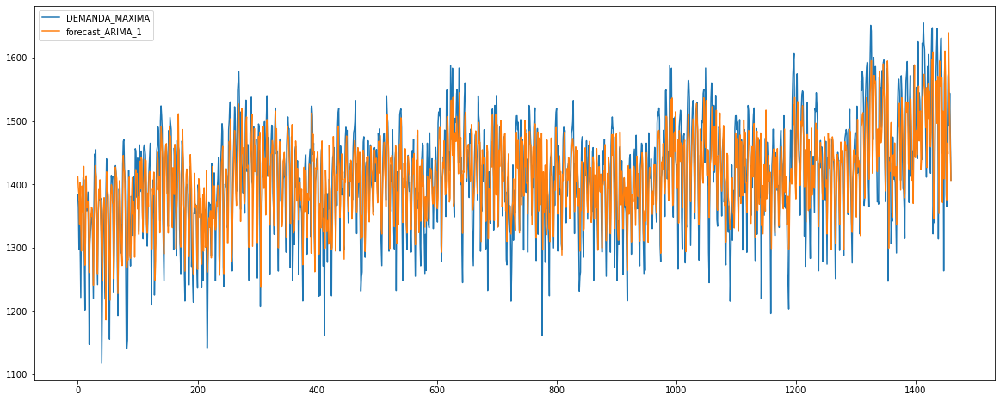

In [13]:
# Pronósticos sobre datos de entrenamiento dados los parámetros óptimos de auto_arima

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Fit the ARIMA model
model_ARIMA_1 = ARIMA(train['DEMANDA_MAXIMA'],
              order=(6,0,30),
              #seasonal_order=(0, 0, 0, 12) no se tomara e cuenta 
            )

# Fit the model
model_ARIMA_1 = model_ARIMA_1.fit()

train_forecast_1 = train.copy()
test_forecast_1 = test.copy()

train_forecast_1['forecast_ARIMA_1'] = model_ARIMA_1.predict() #(start=1, end=1650)
train_forecast_1[['DEMANDA_MAXIMA','forecast_ARIMA_1']].plot(figsize=(20,8))

1460
1826


<AxesSubplot:>

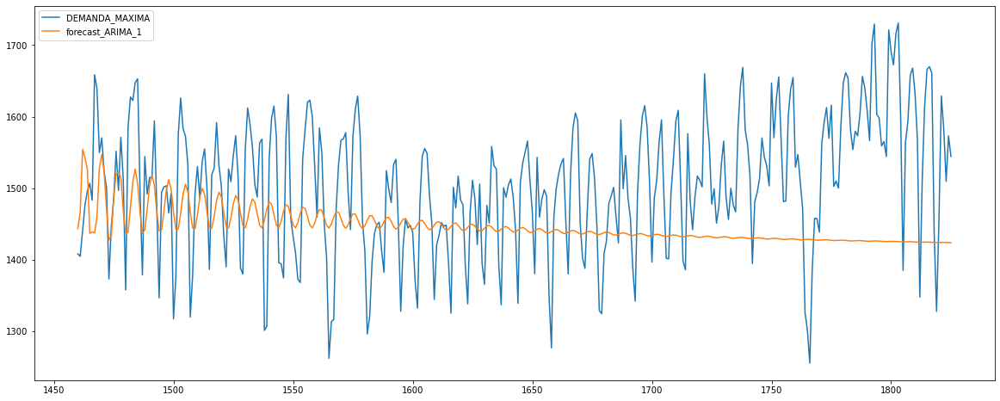

In [14]:
# Pronóstico sobre datos de prueba
# Pronosticar y comparar con datos de prueba

# start date
start1 =len(train)
print(start1)
# End date
#end3 = len(train3)+len(test3)
end1 = len(train)+366
print(end1)

test_forecast_1['forecast_ARIMA_1'] = model_ARIMA_1.predict(start=start1, end=end1, dynamic= True, typ = 'levels')
test_forecast_1[['DEMANDA_MAXIMA','forecast_ARIMA_1']].plot(figsize=(20,8))

In [15]:
# Evaluacion del Modelo ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error,mean_absolute_percentage_error,r2_score

print("MSE of Auto ARIMA:", mean_squared_error(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_ARIMA_1']))
print("RMSE of Auto ARIMA:", np.sqrt(mean_squared_error(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_ARIMA_1'])))
print("MAE of Auto ARIMA:", mean_absolute_error(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_ARIMA_1']))
print("MAPE of Auto ARIMA:", mean_absolute_percentage_error(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_ARIMA_1']))
print("R2 of Auto ARIMA:", r2_score(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_ARIMA_1']))

MSE of Auto ARIMA: 12618.054696934685
RMSE of Auto ARIMA: 112.33011482650005
MAE of Auto ARIMA: 91.36914090960187
MAPE of Auto ARIMA: 0.059533788922983284
R2 of Auto ARIMA: -0.4619427586541216


# PROPHET de facebook

In [16]:
!pip install prophet

Defaulting to user installation because normal site-packages is not writeable


In [17]:
from prophet import Prophet

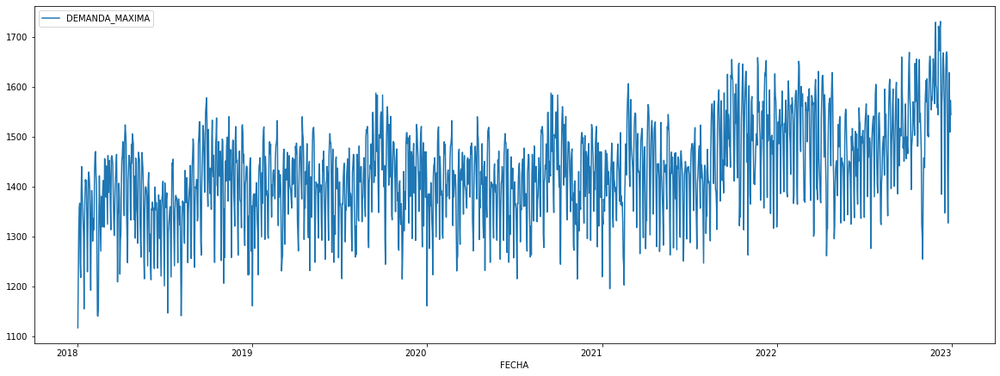

In [18]:
#Visualizar datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
data.plot.line(x='FECHA', y='DEMANDA_MAXIMA', ax = axes, rot=0)
plt.show()

In [19]:
dataPROPHET = data[['FECHA','DEMANDA_MAXIMA']]
dataPROPHET.head()

,FECHA,DEMANDA_MAXIMA
0,2018-06-19,1383.68300
1,2018-06-20,1364.62400
2,2018-06-21,1296.62605
3,2018-06-22,1373.40000
4,2018-06-23,1302.90000


In [20]:
#Dividir para entrenar y probar datos
print(dataPROPHET.shape)

# primeras filas como entrenamiento que representan un 80 % del total de datos
trainPf = dataPROPHET[0:1826]

# filas restantes para el pruebas
testPf = dataPROPHET[1300:]

print(trainPf.shape, testPf.shape)

(1826, 2)
(1826, 2) (526, 2)


In [21]:
# Copiamos las Tablas y Modificamos el Nombre de las Columnas
train_fb = trainPf.copy()
test_fb = testPf.copy()

train_fb.columns = ['ds','y']
test_fb.columns = ['ds','y']

train_fb.head()

,ds,y
0,2018-06-19,1383.68300
1,2018-06-20,1364.62400
2,2018-06-21,1296.62605
3,2018-06-22,1373.40000
4,2018-06-23,1302.90000


22:31:29 - cmdstanpy - INFO - Chain [1] start processing
22:31:29 - cmdstanpy - INFO - Chain [1] done processing


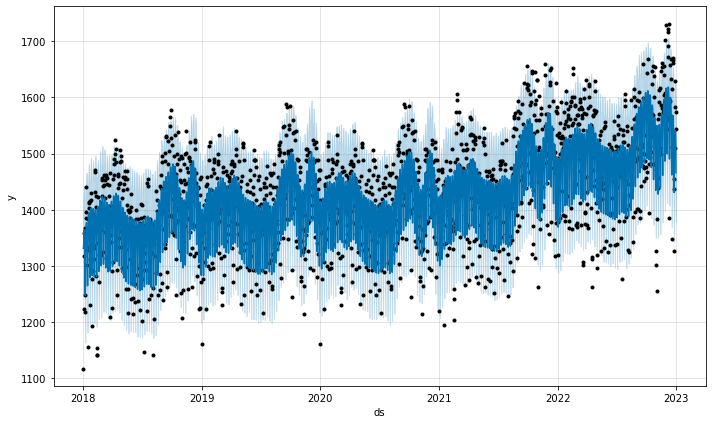

In [22]:
# Entrenamos en Modelo PROPHET
model_prophet = Prophet()
model_prophet.fit(train_fb)

forecast = model_prophet.predict()
fig = model_prophet.plot(forecast)

<AxesSubplot:>

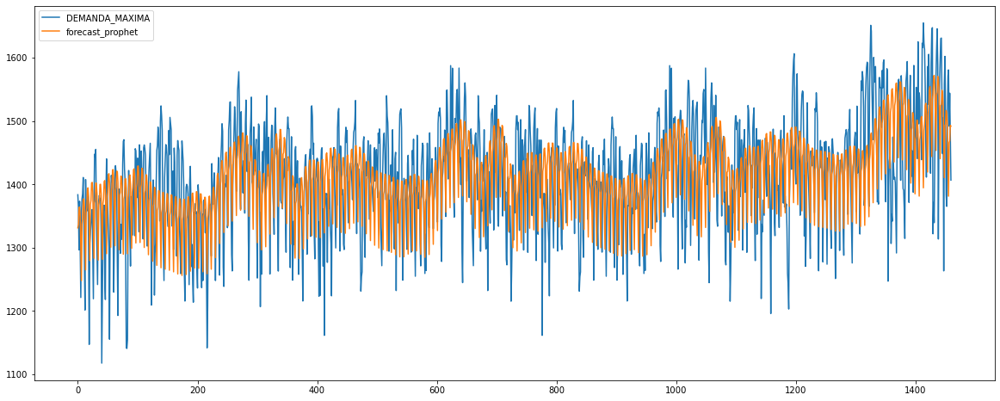

In [23]:
# entrenamieto del Modelo PROPHET 
train_forecast_1['forecast_prophet'] = forecast['yhat']
train_forecast_1[['DEMANDA_MAXIMA','forecast_prophet']].plot(figsize=(20,8))

<AxesSubplot:>

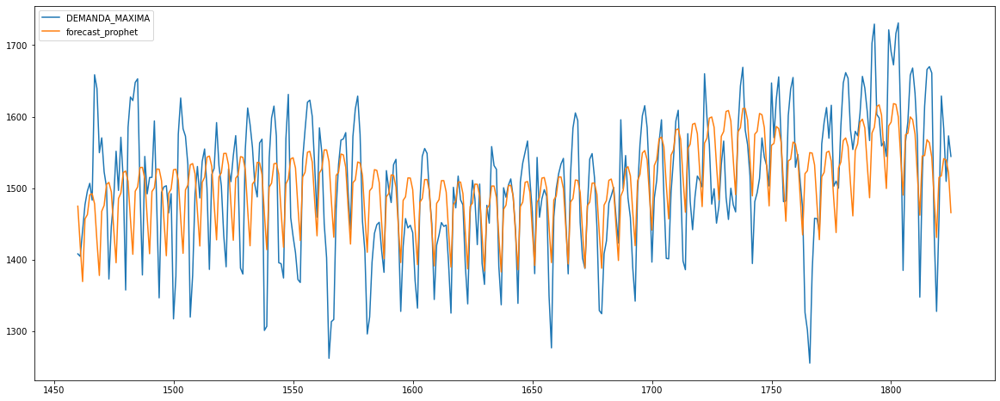

In [24]:
future_data = model_prophet.make_future_dataframe(periods=526)
forecast = model_prophet.predict(future_data)

#test_prueba = prueba2['yhat']
#test_prueba.tail(10)

test_forecast_1['forecast_prophet'] = forecast['yhat']
test_forecast_1[['DEMANDA_MAXIMA','forecast_prophet']].plot(figsize=(20,8))

In [25]:
# evaluacion
from sklearn.metrics import mean_absolute_error, mean_squared_error,mean_absolute_percentage_error,r2_score

print("MSE of Facebook Prophet:", mean_squared_error(test_forecast_1['DEMANDA_MAXIMA'],test_forecast_1['forecast_prophet']))
print("RMSE of Facebook Prophet:", np.sqrt(mean_squared_error(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_prophet'])))
print("MAE of Facebook Prophet:", mean_absolute_error(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_prophet']))
print("MAPE of Facebook Prophet:", mean_absolute_percentage_error(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_prophet']))
print("R2 of Facebook Prophet:", r2_score(test_forecast_1['DEMANDA_MAXIMA'], test_forecast_1['forecast_prophet']))

MSE of Facebook Prophet: 6386.025826428129
RMSE of Facebook Prophet: 79.91261368787865
MAE of Facebook Prophet: 62.187268627208205
MAPE of Facebook Prophet: 0.04191463448522816
R2 of Facebook Prophet: 0.26010748583988863


# Grafica Comparativa de los Modelos

<AxesSubplot:>

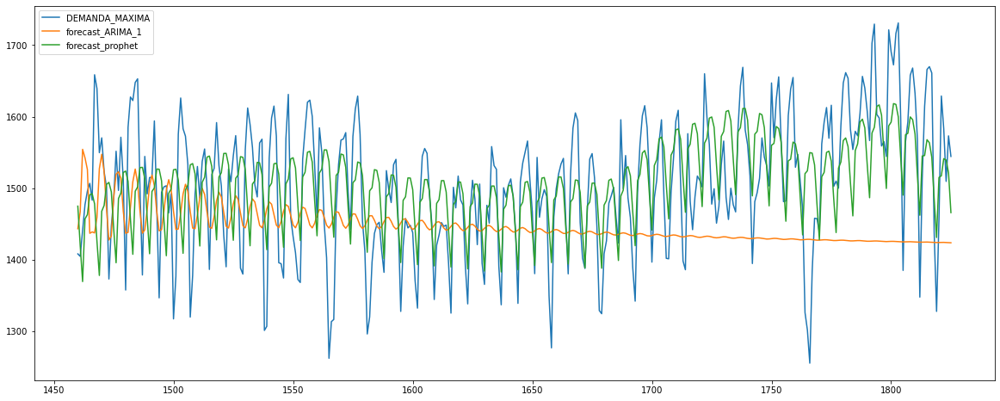

In [26]:
test_forecast_1[['DEMANDA_MAXIMA','forecast_ARIMA_1', 'forecast_prophet']].plot(figsize=(20,8))

# Prediccio con el modelo ARIMA (Utilizando todos los dias de la Semana)

## Hora 1:00 am

In [27]:
# elegimos las columnas a utilizar 
datatA_h1=data[['FECHA','H1']]
datatA_h1.head()

,FECHA,H1
0,2018-06-19,829.66601
1,2018-06-20,850.18500
2,2018-06-21,854.45748
3,2018-06-22,816.30200
4,2018-06-23,865.80000


In [28]:
# Separar los datos a utilizar
datatAh1 = datatA_h1[1220:]
datatAh1.head()

,FECHA,H1
1220,2021-05-05,983.62
1221,2021-05-06,899.47
1222,2021-05-07,901.68
1223,2021-05-08,912.50
1224,2021-05-09,876.66


In [29]:
# entrenamiento con arima utilizando todos los datos
arima_tAh1 = ARIMA(datatAh1['H1'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh1 = arima_tAh1.fit()

In [30]:
# Prediccion
starth1 = len(datatAh1)
endh1 = len(datatAh1)+10

prediccionAh1 = arima_ftAh1.predict(start=starth1, end=endh1, )
prediccionAh1.tail(11)

1826    1115.531179
1827    1092.688903
1828    1131.544601
1829    1165.505610
1830    1140.855223
1831    1141.896937
1832    1159.116308
1833    1118.257651
1834    1085.104586
1835    1128.143718
1836    1160.746870
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 2:00 am

In [31]:
# elegimos las columnas a utilizar 
datatA_h2=data[['FECHA','H2']]
datatA_h2.head()

,FECHA,H2
0,2018-06-19,789.72531
1,2018-06-20,812.88700
2,2018-06-21,804.26173
3,2018-06-22,784.32900
4,2018-06-23,812.86000


In [32]:
# Separar los datos a utilizar
datatAh2 = datatA_h2[1220:]
datatAh2.head()

,FECHA,H2
1220,2021-05-05,939.18
1221,2021-05-06,860.53
1222,2021-05-07,859.79
1223,2021-05-08,868.84
1224,2021-05-09,829.98


In [33]:
# entrenamiento con arima utilizando todos los datos
arima_tAh2 = ARIMA(datatAh2['H2'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh2 = arima_tAh2.fit()

In [34]:
# Prediccion
starth2 = len(datatAh2)
endh2 = len(datatAh2)+10

prediccionAh2 = arima_ftAh2.predict(start=starth2, end=endh2, )
prediccionAh2.tail(11)

1826    1056.818616
1827    1031.971957
1828    1066.114647
1829    1101.016859
1830    1082.497610
1831    1080.721622
1832    1096.714426
1833    1060.427777
1834    1024.849451
1835    1061.942788
1836    1097.564050
Name: predicted_mean, dtype: float64

## Hora 3:00 am

In [35]:
# elegimos las columnas a utilizar 
datatA_h3=data[['FECHA','H3']]
datatA_h3.head()

,FECHA,H3
0,2018-06-19,773.46037
1,2018-06-20,779.25600
2,2018-06-21,787.21522
3,2018-06-22,751.19103
4,2018-06-23,789.22000


In [36]:
# Separar los datos a utilizar
datatAh3 = datatA_h3[1220:]
datatAh3.head()

,FECHA,H3
1220,2021-05-05,912.01
1221,2021-05-06,840.33
1222,2021-05-07,848.26
1223,2021-05-08,852.17
1224,2021-05-09,808.20


In [37]:
# entrenamiento con arima utilizando todos los datos
arima_tAh3 = ARIMA(datatAh3['H3'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh3 = arima_tAh3.fit()

In [38]:
# Prediccion
starth3 = len(datatAh3)
endh3 = len(datatAh3)+10

prediccionAh3 = arima_ftAh3.predict(start=starth3, end=endh3, )
prediccionAh3.tail(11)

1826    1014.099444
1827     990.121240
1828    1031.279968
1829    1060.565164
1830    1040.103536
1831    1040.412001
1832    1057.579531
1833    1019.996286
1834     984.538841
1835    1024.721977
1836    1058.473196
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 4:00 am

In [39]:
# elegimos las columnas a utilizar 
datatA_h4=data[['FECHA','H4']]
datatA_h4.head()

,FECHA,H4
0,2018-06-19,765.42196
1,2018-06-20,768.77200
2,2018-06-21,764.21218
3,2018-06-22,746.67950
4,2018-06-23,776.12000


In [40]:
# Separar los datos a utilizar
datatAh4 = datatA_h4[1220:]
datatAh4.head()

,FECHA,H4
1220,2021-05-05,894.56
1221,2021-05-06,835.64
1222,2021-05-07,842.42
1223,2021-05-08,839.87
1224,2021-05-09,790.20


In [41]:
# entrenamiento con arima utilizando todos los datos
arima_tAh4 = ARIMA(datatAh4['H4'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh4 = arima_tAh4.fit()

In [42]:
# Prediccion
starth4 = len(datatAh4)
endh4 = len(datatAh4)+10

prediccionAh4 = arima_ftAh4.predict(start=starth4, end=endh4, )
prediccionAh4.tail(11)

1826     972.718026
1827     953.662279
1828    1004.792527
1829    1028.009907
1830    1009.722343
1831    1020.321045
1832    1028.968551
1833     973.299562
1834     942.897106
1835     993.684262
1836    1023.347119
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 5:00 am

In [43]:
# elegimos las columnas a utilizar 
datatA_h5=data[['FECHA','H5']]
datatA_h5.head()

,FECHA,H5
0,2018-06-19,779.75979
1,2018-06-20,777.54700
2,2018-06-21,776.65841
3,2018-06-22,760.74331
4,2018-06-23,787.17000


In [44]:
# Separar los datos a utilizar
datatAh5 = datatA_h5[1220:]
datatAh5.head()

,FECHA,H5
1220,2021-05-05,912.60
1221,2021-05-06,850.42
1222,2021-05-07,855.71
1223,2021-05-08,853.11
1224,2021-05-09,791.10


In [45]:
# entrenamiento con arima utilizando todos los datos
arima_tAh5 = ARIMA(datatAh5['H5'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh5 = arima_tAh5.fit()

In [46]:
# Prediccion
starth5 = len(datatAh5)
endh5 = len(datatAh5)+10

prediccionAh5 = arima_ftAh5.predict(start=starth5, end=endh5, )
prediccionAh5.tail(11)

1826     969.962585
1827     964.641122
1828    1026.356353
1829    1043.201759
1830    1029.942064
1831    1042.400070
1832    1033.073303
1833     967.133616
1834     954.800471
1835    1014.438078
1836    1038.038808
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 6:00 am

In [47]:
# elegimos las columnas a utilizar 
datatA_h6=data[['FECHA','H6']]
datatA_h6.head()

,FECHA,H6
0,2018-06-19,840.86665
1,2018-06-20,842.74600
2,2018-06-21,809.09779
3,2018-06-22,819.11030
4,2018-06-23,825.81000


In [48]:
# Separar los datos a utilizar
datatAh6 = datatA_h6[1220:]
datatAh6.head()

,FECHA,H6
1220,2021-05-05,955.28
1221,2021-05-06,912.16
1222,2021-05-07,909.01
1223,2021-05-08,891.86
1224,2021-05-09,807.98


In [49]:
# entrenamiento con arima utilizando todos los datos
arima_tAh6 = ARIMA(datatAh6['H6'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh6 = arima_tAh6.fit()

In [50]:
# Prediccion
starth6 = len(datatAh6)
endh6 = len(datatAh6)+10

prediccionAh6 = arima_ftAh6.predict(start=starth6, end=endh6, )
prediccionAh6.tail(11)

1826     864.863557
1827     893.759120
1828     975.063618
1829     995.617095
1830     995.134375
1831    1001.471185
1832     960.141903
1833     872.552282
1834     887.212842
1835     968.499817
1836     994.036909
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 7:00 am

In [51]:
# elegimos las columnas a utilizar 
datatA_h7=data[['FECHA','H7']]
datatA_h7.head()

,FECHA,H7
0,2018-06-19,913.12915
1,2018-06-20,939.34800
2,2018-06-21,765.19724
3,2018-06-22,909.09767
4,2018-06-23,824.88000


In [52]:
# Separar los datos a utilizar
datatAh7 = datatA_h7[1220:]
datatAh7.head()

,FECHA,H7
1220,2021-05-05,988.839
1221,2021-05-06,941.956
1222,2021-05-07,942.005
1223,2021-05-08,862.272
1224,2021-05-09,740.440


In [53]:
# entrenamiento con arima utilizando todos los datos
arima_tAh7 = ARIMA(datatAh7['H7'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh7 = arima_tAh7.fit()

In [54]:
# Prediccion
starth7 = len(datatAh7)
endh7 = len(datatAh7)+10

prediccionAh7 = arima_ftAh7.predict(start=starth7, end=endh7, )
prediccionAh7.tail(11)

1826     895.352925
1827     960.550479
1828    1099.868825
1829    1065.172846
1830    1121.183084
1831    1093.210274
1832    1037.445180
1833     873.211740
1834     967.938522
1835    1070.469863
1836    1086.073368
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 8:00 am

In [55]:
# elegimos las columnas a utilizar 
datatA_h8=data[['FECHA','H8']]
datatA_h8.head()

,FECHA,H8
0,2018-06-19,1006.86998
1,2018-06-20,1023.46400
2,2018-06-21,825.54627
3,2018-06-22,1016.89217
4,2018-06-23,917.65600


In [56]:
# Separar los datos a utilizar
datatAh8 = datatA_h8[1220:]
datatAh8.head()

,FECHA,H8
1220,2021-05-05,1075.081
1221,2021-05-06,1029.481
1222,2021-05-07,1031.471
1223,2021-05-08,946.729
1224,2021-05-09,798.024


In [57]:
# entrenamiento con arima utilizando todos los datos
arima_tAh8 = ARIMA(datatAh8['H8'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh8 = arima_tAh8.fit()

In [58]:
# Prediccion
starth8 = len(datatAh8)
endh8 = len(datatAh8)+10

prediccionAh8 = arima_ftAh8.predict(start=starth8, end=endh8, )
prediccionAh8.tail(11)

1826     966.190285
1827    1073.222995
1828    1218.295870
1829    1174.053446
1830    1244.601251
1831    1208.439769
1832    1125.369997
1833     929.122208
1834    1067.305554
1835    1182.410984
1836    1194.960495
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 9:00 am

In [59]:
# elegimos las columnas a utilizar 
datatA_h9=data[['FECHA','H9']]
datatA_h9.head()

,FECHA,H9
0,2018-06-19,1061.87509
1,2018-06-20,1075.55300
2,2018-06-21,905.19986
3,2018-06-22,1067.76600
4,2018-06-23,997.94600


In [60]:
# Separar los datos a utilizar
datatAh9 = datatA_h9[1220:]
datatAh9.head()

,FECHA,H9
1220,2021-05-05,1133.168
1221,2021-05-06,1110.080
1222,2021-05-07,1111.370
1223,2021-05-08,1036.782
1224,2021-05-09,856.897


In [61]:
# entrenamiento con arima utilizando todos los datos
arima_tAh9 = ARIMA(datatAh9['H9'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh9 = arima_tAh9.fit()

In [62]:
# Prediccion
starth9 = len(datatAh9)
endh9 = len(datatAh9)+10

prediccionAh9 = arima_ftAh9.predict(start=starth9, end=endh9, )
prediccionAh9.tail(11)

1826    1032.685938
1827    1162.703270
1828    1340.360824
1829    1297.612671
1830    1356.736483
1831    1344.170465
1832    1237.668175
1833     983.778313
1834    1162.288434
1835    1300.886494
1836    1318.579947
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 10:00 am

In [63]:
# elegimos las columnas a utilizar 
datatA_h10=data[['FECHA','H10']]
datatA_h10.head()

,FECHA,H10
0,2018-06-19,1084.66400
1,2018-06-20,1087.82700
2,2018-06-21,941.43900
3,2018-06-22,1086.68795
4,2018-06-23,1034.96900


In [64]:
# Separar los datos a utilizar
datatAh10 = datatA_h10[1220:]
datatAh10.head()

,FECHA,H10
1220,2021-05-05,1163.605
1221,2021-05-06,1132.676
1222,2021-05-07,1143.839
1223,2021-05-08,1075.291
1224,2021-05-09,897.059


In [65]:
# entrenamiento con arima utilizando todos los datos
arima_tAh10 = ARIMA(datatAh10['H10'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh10 = arima_tAh10.fit()

In [66]:
# Prediccion
starth10 = len(datatAh10)
endh10 = len(datatAh10)+10

prediccionAh10 = arima_ftAh10.predict(start=starth10, end=endh10, )
prediccionAh10.tail(11)

1826    1124.876428
1827    1252.886313
1828    1398.987051
1829    1342.692621
1830    1406.385239
1831    1397.054280
1832    1274.945161
1833    1061.580439
1834    1243.007254
1835    1356.006982
1836    1365.774067
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 11:00 am

In [67]:
# elegimos las columnas a utilizar 
datatA_h11=data[['FECHA','H11']]
datatA_h11.head()

,FECHA,H11
0,2018-06-19,1103.70178
1,2018-06-20,1108.20800
2,2018-06-21,965.71475
3,2018-06-22,1132.36612
4,2018-06-23,1041.84000


In [68]:
# Separar los datos a utilizar
datatAh11 = datatA_h11[1220:]
datatAh11.head()

,FECHA,H11
1220,2021-05-05,1206.875
1221,2021-05-06,1151.692
1222,2021-05-07,1157.998
1223,2021-05-08,1096.582
1224,2021-05-09,927.847


In [69]:
# entrenamiento con arima utilizando todos los datos
arima_tAh11 = ARIMA(datatAh11['H11'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh11 = arima_tAh11.fit()

In [70]:
# Prediccion
starth11 = len(datatAh11)
endh11 = len(datatAh11)+10

prediccionAh11 = arima_ftAh11.predict(start=starth11, end=endh11, )
prediccionAh11.tail(11)

1826    1139.721162
1827    1322.085509
1828    1417.203192
1829    1410.208197
1830    1417.467636
1831    1463.357567
1832    1278.908859
1833    1110.850528
1834    1265.147014
1835    1413.425055
1836    1372.465536
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 12:00 am

In [71]:
# elegimos las columnas a utilizar 
datatA_h12=data[['FECHA','H12']]
datatA_h12.head()

,FECHA,H12
0,2018-06-19,1082.72739
1,2018-06-20,1100.56100
2,2018-06-21,968.62748
3,2018-06-22,1114.81595
4,2018-06-23,1040.92700


In [72]:
# Separar los datos a utilizar
datatAh12 = datatA_h12[1220:]
datatAh12.head()

,FECHA,H12
1220,2021-05-05,1187.092
1221,2021-05-06,1147.559
1222,2021-05-07,1148.460
1223,2021-05-08,1090.220
1224,2021-05-09,928.033


In [73]:
# entrenamiento con arima utilizando todos los datos
arima_tAh12 = ARIMA(datatAh12['H12'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh12 = arima_tAh12.fit()

In [74]:
# Prediccion
starth12 = len(datatAh12)
endh12 = len(datatAh12)+10

prediccionAh12 = arima_ftAh12.predict(start=starth12, end=endh12, )
prediccionAh12.tail(11)

1826    1193.924713
1827    1309.877663
1828    1502.386800
1829    1388.689458
1830    1452.951169
1831    1414.469441
1832    1354.568090
1833    1114.469416
1834    1318.389083
1835    1427.297193
1836    1429.068752
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 13:00 am

In [75]:
# elegimos las columnas a utilizar 
datatA_h13=data[['FECHA','H13']]
datatA_h13.head()

,FECHA,H13
0,2018-06-19,1040.78100
1,2018-06-20,1047.14600
2,2018-06-21,937.36881
3,2018-06-22,1063.44910
4,2018-06-23,997.31200


In [76]:
# Separar los datos a utilizar
datatAh13 = datatA_h13[1220:]
datatAh13.head()

,FECHA,H13
1220,2021-05-05,1158.693
1221,2021-05-06,1111.301
1222,2021-05-07,1110.269
1223,2021-05-08,1046.867
1224,2021-05-09,923.256


In [77]:
# entrenamiento con arima utilizando todos los datos
arima_tAh13 = ARIMA(datatAh13['H13'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh13 = arima_tAh13.fit()

In [78]:
# Prediccion
starth13 = len(datatAh13)
endh13 = len(datatAh13)+10

prediccionAh13 = arima_ftAh13.predict(start=starth13, end=endh13, )
prediccionAh13.tail(11)

1826    1240.591214
1827    1342.855484
1828    1490.100024
1829    1380.898781
1830    1453.171978
1831    1436.635699
1832    1339.926766
1833    1145.702968
1834    1345.183820
1835    1422.346736
1836    1413.033437
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 14:00 am

In [79]:
# elegimos las columnas a utilizar 
datatA_h14=data[['FECHA','H14']]
datatA_h14.head()

,FECHA,H14
0,2018-06-19,1073.69673
1,2018-06-20,1075.64200
2,2018-06-21,947.52831
3,2018-06-22,1091.92100
4,2018-06-23,993.26200


In [80]:
# Separar los datos a utilizar
datatAh14 = datatA_h14[1220:]
datatAh14.head()

,FECHA,H14
1220,2021-05-05,1184.283
1221,2021-05-06,1137.057
1222,2021-05-07,1133.870
1223,2021-05-08,1055.887
1224,2021-05-09,924.794


In [81]:
# entrenamiento con arima utilizando todos los datos
arima_tAh14 = ARIMA(datatAh14['H14'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh14 = arima_tAh14.fit()

In [82]:
# Prediccion
starth14 = len(datatAh14)
endh14 = len(datatAh14)+10

prediccionAh14 = arima_ftAh14.predict(start=starth14, end=endh14, )
prediccionAh14.tail(11)

1826    1256.313093
1827    1368.921683
1828    1529.950813
1829    1455.409829
1830    1525.560046
1831    1487.484256
1832    1313.956503
1833    1156.288535
1834    1352.657214
1835    1473.026570
1836    1445.149897
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 15:00 am

In [83]:
# elegimos las columnas a utilizar 
datatA_h15=data[['FECHA','H15']]
datatA_h15.head()

,FECHA,H15
0,2018-06-19,1117.92458
1,2018-06-20,1119.15700
2,2018-06-21,967.22967
3,2018-06-22,1132.91900
4,2018-06-23,1009.15600


In [84]:
# Separar los datos a utilizar
datatAh15 = datatA_h15[1220:]
datatAh15.head()

,FECHA,H15
1220,2021-05-05,1203.705
1221,2021-05-06,1150.763
1222,2021-05-07,1153.753
1223,2021-05-08,1055.978
1224,2021-05-09,936.760


In [85]:
# entrenamiento con arima utilizando todos los datos
arima_tAh15 = ARIMA(datatAh15['H15'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh15 = arima_tAh15.fit()

In [86]:
# Prediccion
starth15 = len(datatAh15)
endh15 = len(datatAh15)+10

prediccionAh15 = arima_ftAh15.predict(start=starth15, end=endh15, )
prediccionAh15.tail(11)

1826    1271.906588
1827    1403.532508
1828    1562.915323
1829    1491.509351
1830    1550.256338
1831    1523.581500
1832    1320.668355
1833    1161.898987
1834    1377.582653
1835    1515.616106
1836    1469.608188
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 16:00 am

In [87]:
# elegimos las columnas a utilizar 
datatA_h16=data[['FECHA','H16']]
datatA_h16.head()

,FECHA,H16
0,2018-06-19,1114.15208
1,2018-06-20,1110.12900
2,2018-06-21,952.41426
3,2018-06-22,1126.98700
4,2018-06-23,992.78300


In [88]:
# Separar los datos a utilizar
datatAh16 = datatA_h16[1220:]
datatAh16.head()

,FECHA,H16
1220,2021-05-05,1191.033
1221,2021-05-06,1148.820
1222,2021-05-07,1146.951
1223,2021-05-08,1044.885
1224,2021-05-09,953.022


In [89]:
# entrenamiento con arima utilizando todos los datos
arima_tAh16 = ARIMA(datatAh16['H16'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh16 = arima_tAh16.fit()

In [90]:
# Prediccion
starth16 = len(datatAh16)
endh16 = len(datatAh16)+10

prediccionAh16 = arima_ftAh16.predict(start=starth16, end=endh16, )
prediccionAh16.tail(11)

1826    1287.273806
1827    1412.224928
1828    1559.357087
1829    1466.927290
1830    1523.279850
1831    1502.258300
1832    1327.454307
1833    1176.653967
1834    1397.101626
1835    1501.984953
1836    1461.964205
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 17:00 am

In [91]:
# elegimos las columnas a utilizar 
datatA_h17=data[['FECHA','H17']]
datatA_h17.head()

,FECHA,H17
0,2018-06-19,1108.293
1,2018-06-20,1098.810
2,2018-06-21,960.886
3,2018-06-22,1121.117
4,2018-06-23,990.660


In [92]:
# Separar los datos a utilizar
datatAh17 = datatA_h17[1220:]
datatAh17.head()

,FECHA,H17
1220,2021-05-05,1169.101
1221,2021-05-06,1150.858
1222,2021-05-07,1128.447
1223,2021-05-08,1042.909
1224,2021-05-09,961.386


In [93]:
# entrenamiento con arima utilizando todos los datos
arima_tAh17 = ARIMA(datatAh17['H17'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh17 = arima_tAh17.fit()

In [94]:
# Prediccion
starth17 = len(datatAh17)
endh17 = len(datatAh17)+10

prediccionAh17 = arima_ftAh17.predict(start=starth17, end=endh17, )
prediccionAh17.tail(11)

1826    1259.254149
1827    1358.966500
1828    1503.293094
1829    1425.169389
1830    1466.134279
1831    1444.343934
1832    1294.816610
1833    1166.475022
1834    1356.988355
1835    1447.951510
1836    1418.732041
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 18:00 am

In [95]:
# elegimos las columnas a utilizar 
datatA_h18=data[['FECHA','H18']]
datatA_h18.head()

,FECHA,H18
0,2018-06-19,1195.74200
1,2018-06-20,1167.80600
2,2018-06-21,1052.84119
3,2018-06-22,1201.86000
4,2018-06-23,1079.58000


In [96]:
# Separar los datos a utilizar
datatAh18 = datatA_h18[1220:]
datatAh18.head()

,FECHA,H18
1220,2021-05-05,1236.59
1221,2021-05-06,1226.35
1222,2021-05-07,1220.03
1223,2021-05-08,1114.17
1224,2021-05-09,1034.39


In [97]:
# entrenamiento con arima utilizando todos los datos
arima_tAh18 = ARIMA(datatAh18['H18'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh18 = arima_tAh18.fit()

In [98]:
# Prediccion
starth18 = len(datatAh18)
endh18 = len(datatAh18)+10

prediccionAh18 = arima_ftAh18.predict(start=starth18, end=endh18, )
prediccionAh18.tail(11)

1826    1224.210575
1827    1305.499543
1828    1392.497484
1829    1335.063404
1830    1359.990089
1831    1370.275919
1832    1249.627333
1833    1143.966841
1834    1272.082840
1835    1362.118239
1836    1330.020829
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 19:00 am

In [99]:
# elegimos las columnas a utilizar 
datatA_h19=data[['FECHA','H19']]
datatA_h19.head()

,FECHA,H19
0,2018-06-19,1382.98300
1,2018-06-20,1363.73400
2,2018-06-21,1282.68365
3,2018-06-22,1370.64000
4,2018-06-23,1300.04000


In [100]:
# Separar los datos a utilizar
datatAh19 = datatA_h19[1220:]
datatAh19.head()

,FECHA,H19
1220,2021-05-05,1421.93
1221,2021-05-06,1400.64
1222,2021-05-07,1366.83
1223,2021-05-08,1330.82
1224,2021-05-09,1273.69


In [101]:
# entrenamiento con arima utilizando todos los datos
arima_tAh19 = ARIMA(datatAh19['H19'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh19 = arima_tAh19.fit()

In [102]:
# Prediccion
starth19 = len(datatAh19)
endh19 = len(datatAh19)+10

prediccionAh19 = arima_ftAh19.predict(start=starth19, end=endh19, )
prediccionAh19.tail(11)

1826    1336.915255
1827    1408.471604
1828    1492.455719
1829    1458.926735
1830    1486.300436
1831    1472.633943
1832    1371.934751
1833    1303.645466
1834    1407.385635
1835    1471.203307
1836    1455.356779
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 20:00 am

In [103]:
# elegimos las columnas a utilizar 
datatA_h20=data[['FECHA','H20']]
datatA_h20.head()

,FECHA,H20
0,2018-06-19,1378.293
1,2018-06-20,1352.600
2,2018-06-21,1283.712
3,2018-06-22,1352.140
4,2018-06-23,1279.740


In [104]:
# Separar los datos a utilizar
datatAh20 = datatA_h20[1220:]
datatAh20.head()

,FECHA,H20
1220,2021-05-05,1398.71
1221,2021-05-06,1384.85
1222,2021-05-07,1353.93
1223,2021-05-08,1317.44
1224,2021-05-09,1270.78


In [105]:
# entrenamiento con arima utilizando todos los datos
arima_tAh20 = ARIMA(datatAh20['H20'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh20 = arima_tAh20.fit()

In [106]:
# Prediccion
starth20 = len(datatAh20)
endh20 = len(datatAh20)+10

prediccionAh20 = arima_ftAh20.predict(start=starth20, end=endh20, )
prediccionAh20.tail(11)

1826    1494.892851
1827    1548.766860
1828    1608.309858
1829    1590.483352
1830    1609.622568
1831    1598.645637
1832    1498.807652
1833    1448.569372
1834    1536.373289
1835    1585.936211
1836    1573.572845
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 21:00 am

In [107]:
# elegimos las columnas a utilizar 
datatA_h21=data[['FECHA','H21']]
datatA_h21.head()

,FECHA,H21
0,2018-06-19,1334.45900
1,2018-06-20,1291.22000
2,2018-06-21,1255.32375
3,2018-06-22,1299.94000
4,2018-06-23,1240.52000


In [108]:
# Separar los datos a utilizar
datatAh21 = datatA_h21[1220:]
datatAh21.head()

,FECHA,H21
1220,2021-05-05,1343.24
1221,2021-05-06,1330.08
1222,2021-05-07,1304.91
1223,2021-05-08,1264.23
1224,2021-05-09,1237.84


In [109]:
# entrenamiento con arima utilizando todos los datos
arima_tAh21 = ARIMA(datatAh21['H21'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh21 = arima_tAh21.fit()

In [110]:
# Prediccion
starth21 = len(datatAh21)
endh21 = len(datatAh21)+10

prediccionAh21 = arima_ftAh21.predict(start=starth21, end=endh21, )
prediccionAh21.tail(11)

1826    1486.201707
1827    1527.132292
1828    1572.535243
1829    1559.590622
1830    1571.263890
1831    1561.195294
1832    1469.520855
1833    1437.844481
1834    1511.365441
1835    1551.199538
1836    1541.556920
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 22:00 am

In [111]:
# elegimos las columnas a utilizar 
datatA_h22=data[['FECHA','H22']]
datatA_h22.head()

,FECHA,H22
0,2018-06-19,1238.816
1,2018-06-20,1194.540
2,2018-06-21,1159.118
3,2018-06-22,1199.910
4,2018-06-23,1169.120


In [112]:
# Separar los datos a utilizar
datatAh22 = datatA_h22[1220:]
datatAh22.head()

,FECHA,H22
1220,2021-05-05,1224.36
1221,2021-05-06,1222.21
1222,2021-05-07,1211.43
1223,2021-05-08,1177.62
1224,2021-05-09,1138.00


In [113]:
# entrenamiento con arima utilizando todos los datos
arima_tAh22 = ARIMA(datatAh22['H22'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh22 = arima_tAh22.fit()

In [114]:
# Prediccion
starth22 = len(datatAh22)
endh22 = len(datatAh22)+10

prediccionAh22 = arima_ftAh22.predict(start=starth22, end=endh22, )
prediccionAh22.tail(11)

1826    1412.796247
1827    1446.800045
1828    1489.531805
1829    1476.034413
1830    1491.951686
1831    1490.077004
1832    1403.279239
1833    1376.518404
1834    1439.542457
1835    1473.573590
1836    1463.385390
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 23:00 am

In [115]:
# elegimos las columnas a utilizar 
datatA_h23=data[['FECHA','H23']]
datatA_h23.head()

,FECHA,H23
0,2018-06-19,1083.550
1,2018-06-20,1062.910
2,2018-06-21,1029.254
3,2018-06-22,1074.630
4,2018-06-23,1065.740


In [116]:
# Separar los datos a utilizar
datatAh23 = datatA_h23[1220:]
datatAh23.head()

,FECHA,H23
1220,2021-05-05,1089.22
1221,2021-05-06,1077.37
1222,2021-05-07,1090.68
1223,2021-05-08,1053.36
1224,2021-05-09,1007.44


In [117]:
# entrenamiento con arima utilizando todos los datos
arima_tAh23 = ARIMA(datatAh23['H23'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh23 = arima_tAh23.fit()

In [118]:
# Prediccion
starth23 = len(datatAh23)
endh23 = len(datatAh23)+10

prediccionAh23 = arima_ftAh23.predict(start=starth23, end=endh23, )
prediccionAh23.tail(11)

1826    1323.274385
1827    1343.053347
1828    1372.858461
1829    1349.283327
1830    1361.918925
1831    1373.360360
1832    1316.213698
1833    1284.282483
1834    1333.259615
1835    1360.726462
1836    1343.472916
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 24:00 am

In [119]:
# elegimos las columnas a utilizar 
datatA_h24=data[['FECHA','H24']]
datatA_h24.head()

,FECHA,H24
0,2018-06-19,950.075
1,2018-06-20,943.710
2,2018-06-21,900.123
3,2018-06-22,952.990
4,2018-06-23,964.970


In [120]:
# Separar los datos a utilizar
datatAh24 = datatA_h24[1220:]
datatAh24.head()

,FECHA,H24
1220,2021-05-05,978.52
1221,2021-05-06,976.30
1222,2021-05-07,983.32
1223,2021-05-08,950.74
1224,2021-05-09,910.87


In [121]:
# entrenamiento con arima utilizando todos los datos
arima_tAh24 = ARIMA(datatAh24['H24'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit model
arima_ftAh24 = arima_tAh24.fit()

In [122]:
# Prediccion
starth24 = len(datatAh24)
endh24 = len(datatAh24)+10

prediccionAh24 = arima_ftAh24.predict(start=starth24, end=endh24, )
prediccionAh24.tail(11)

1826    1197.951090
1827    1230.406484
1828    1258.623406
1829    1234.417226
1830    1247.415363
1831    1257.805876
1832    1205.644690
1833    1174.281672
1834    1222.377354
1835    1249.277174
1836    1232.058801
Name: predicted_mean, dtype: float64

- Resultado 1827 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 1828 correspode a la fecha Lunes, 02 de enero de 2023
- ....
- resultado 1833 correspode a la fecha Sabado, 07 de enero de 2023

# Prediccion con el Modelo Prophet (Utilizando todos los dias de la Semana)

## Hora 1:00

In [123]:
# elegimos las columas a utilizar 
datah1=data[['FECHA','H1']]
datah1.head()

,FECHA,H1
0,2018-06-19,829.66601
1,2018-06-20,850.18500
2,2018-06-21,854.45748
3,2018-06-22,816.30200
4,2018-06-23,865.80000


In [124]:
# Cambiamos el Nombre de las Columnas
entrh1 = datah1.copy()
entrh1.columns = ['ds','y']
entrenamient_h1 = entrh1[1220:]
entrenamient_h1.head()

,ds,y
1220,2021-05-05,983.62
1221,2021-05-06,899.47
1222,2021-05-07,901.68
1223,2021-05-08,912.50
1224,2021-05-09,876.66


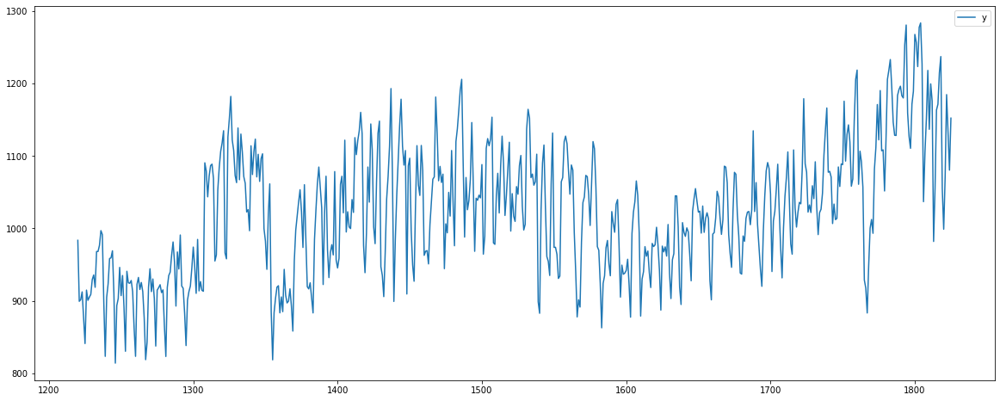

In [125]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h1.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:38 - cmdstanpy - INFO - Chain [1] start processing
22:33:38 - cmdstanpy - INFO - Chain [1] done processing


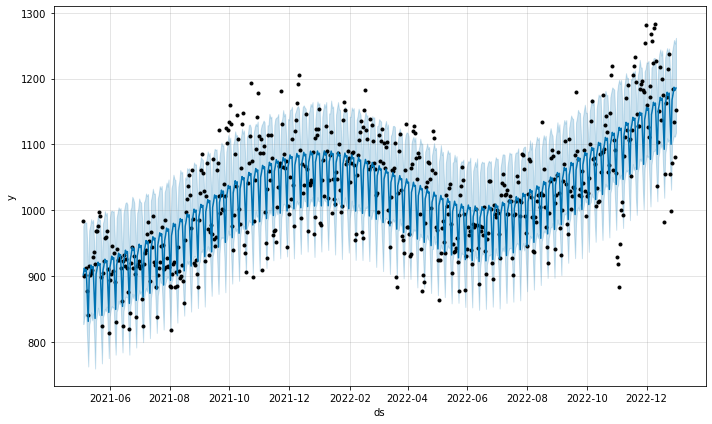

In [126]:
# Entrenamiento co el modelo PROPHET
model_prophet_h1 = Prophet()
model_prophet_h1.fit(entrenamient_h1)

forecast_h1 = model_prophet_h1.predict()
fig_h1 = model_prophet_h1.plot(forecast_h1)

In [127]:
# Predicción 10 dias 
future_data_h1 = model_prophet_h1.make_future_dataframe(periods=10)
prueba_h1 = model_prophet_h1.predict(future_data_h1)

test_prueba_h1 = prueba_h1['yhat']
# mostrar resultados
test_prueba_h1.tail(12)

604    1182.359000
605    1185.655265
606    1148.482314
607    1107.795088
608    1175.621140
609    1184.027670
610    1194.520255
611    1189.983582
612    1193.279847
613    1156.106896
614    1115.419670
615    1183.245722
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 2:00

In [128]:
# se elige las columas a utilizar 
datah2=data[['FECHA','H2']]
datah2.head()

,FECHA,H2
0,2018-06-19,789.72531
1,2018-06-20,812.88700
2,2018-06-21,804.26173
3,2018-06-22,784.32900
4,2018-06-23,812.86000


In [129]:
# Cambiamos el Nombre de las Columnas
entrh2 = datah2.copy()
entrh2.columns = ['ds','y']
entrenamient_h2 = entrh2[1220:]
entrenamient_h2.head()

,ds,y
1220,2021-05-05,939.18
1221,2021-05-06,860.53
1222,2021-05-07,859.79
1223,2021-05-08,868.84
1224,2021-05-09,829.98


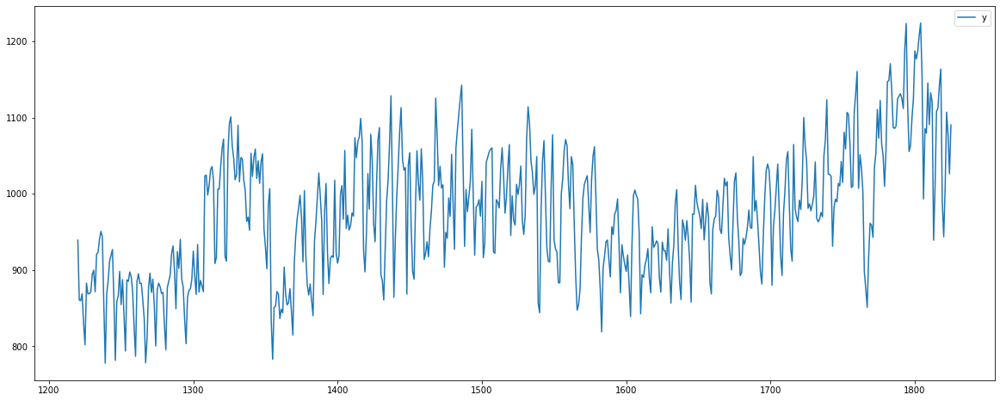

In [130]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h2.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:40 - cmdstanpy - INFO - Chain [1] start processing
22:33:40 - cmdstanpy - INFO - Chain [1] done processing


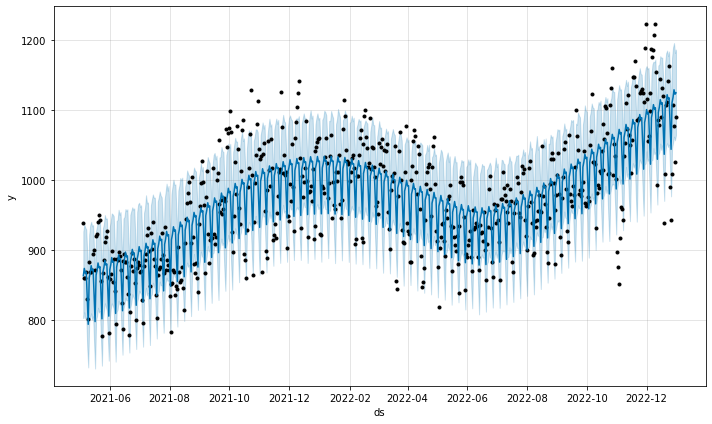

In [131]:
# Entrenamiento co el modelo PROPHET
model_prophet_h2 = Prophet()
model_prophet_h2.fit(entrenamient_h2)

forecast_h2 = model_prophet_h2.predict()
fig_h2 = model_prophet_h2.plot(forecast_h2)

In [132]:
# Predicción 10 dias 
future_data_h2 = model_prophet_h2.make_future_dataframe(periods=10)
prueba_h2 = model_prophet_h2.predict(future_data_h2)

test_prueba_h2 = prueba_h2['yhat']
# mostrar resultados
test_prueba_h2.tail(12)

604    1123.005693
605    1124.929018
606    1086.939045
607    1051.220207
608    1117.939619
609    1125.508425
610    1136.463330
611    1130.091397
612    1132.014722
613    1094.024749
614    1058.305911
615    1125.025323
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 3:00

In [133]:
# se elige las columas a utilizar 
datah3=data[['FECHA','H3']]
datah3.head()

,FECHA,H3
0,2018-06-19,773.46037
1,2018-06-20,779.25600
2,2018-06-21,787.21522
3,2018-06-22,751.19103
4,2018-06-23,789.22000


In [134]:
# Cambiamos el Nombre de las Columnas
entrh3 = datah3.copy()
entrh3.columns = ['ds','y']
entrenamient_h3 = entrh3[1220:]
entrenamient_h3.head()

,ds,y
1220,2021-05-05,912.01
1221,2021-05-06,840.33
1222,2021-05-07,848.26
1223,2021-05-08,852.17
1224,2021-05-09,808.20


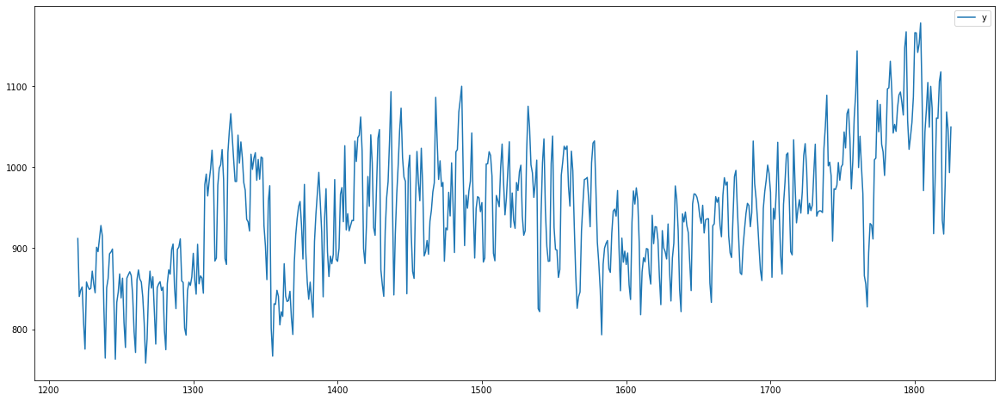

In [135]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h3.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:42 - cmdstanpy - INFO - Chain [1] start processing
22:33:42 - cmdstanpy - INFO - Chain [1] done processing


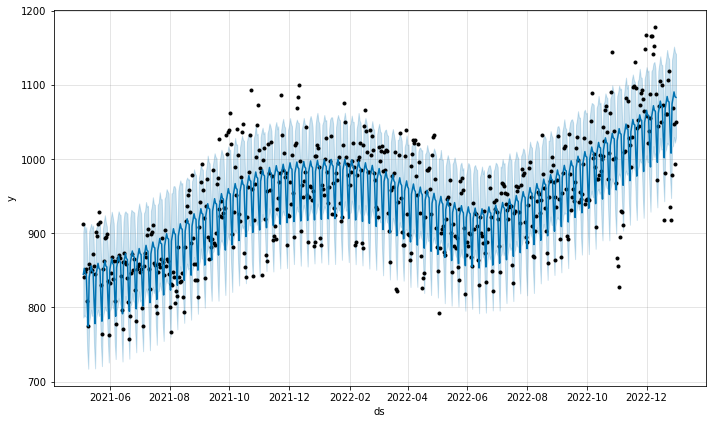

In [136]:
# Entrenamiento co el modelo PROPHET
model_prophet_h3 = Prophet()
model_prophet_h3.fit(entrenamient_h3)

forecast_h3 = model_prophet_h3.predict()
fig_h3 = model_prophet_h3.plot(forecast_h3)

In [137]:
# Predicción 10 dias 
future_data_h3 = model_prophet_h3.make_future_dataframe(periods=10)
prueba_h3 = model_prophet_h3.predict(future_data_h3)

test_prueba_h3 = prueba_h3['yhat']
# mostrar resultados
test_prueba_h3.tail(12)

604    1083.882035
605    1082.986675
606    1042.867698
607    1014.013679
608    1080.112696
609    1087.952266
610    1096.522909
611    1090.066540
612    1089.171181
613    1049.052203
614    1020.198185
615    1086.297201
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 4:00

In [138]:
# se elige las columas a utilizar 
datah4=data[['FECHA','H4']]
datah4.head()

,FECHA,H4
0,2018-06-19,765.42196
1,2018-06-20,768.77200
2,2018-06-21,764.21218
3,2018-06-22,746.67950
4,2018-06-23,776.12000


In [139]:
# Cambiamos el Nombre de las Columnas
entrh4 = datah4.copy()
entrh4.columns = ['ds','y']
entrenamient_h4 = entrh4[1220:]
entrenamient_h4.head()

,ds,y
1220,2021-05-05,894.56
1221,2021-05-06,835.64
1222,2021-05-07,842.42
1223,2021-05-08,839.87
1224,2021-05-09,790.20


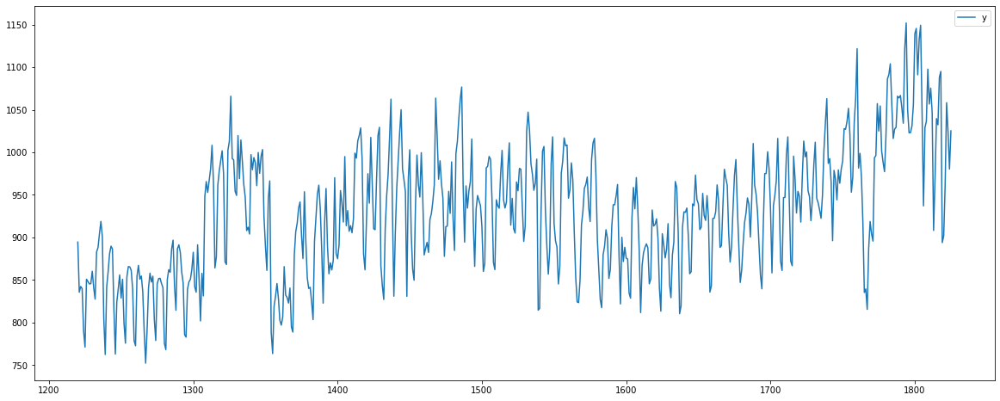

In [140]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h4.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:44 - cmdstanpy - INFO - Chain [1] start processing
22:33:44 - cmdstanpy - INFO - Chain [1] done processing


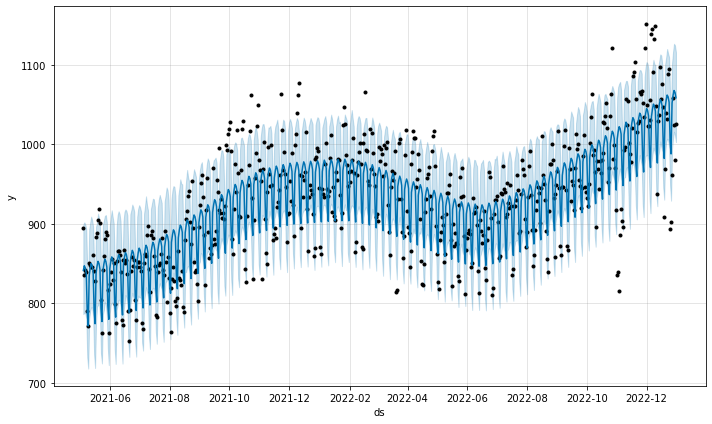

In [141]:
# Entrenamiento co el modelo PROPHET
model_prophet_h4 = Prophet()
model_prophet_h4.fit(entrenamient_h4)

forecast_h4 = model_prophet_h4.predict()
fig_h4 = model_prophet_h4.plot(forecast_h4)

In [142]:
# Predicción 10 dias 
future_data_h4 = model_prophet_h4.make_future_dataframe(periods=10)
prueba_h4 = model_prophet_h4.predict(future_data_h4)

test_prueba_h4 = prueba_h4['yhat']
# mostrar resultados
test_prueba_h4.tail(12)

604    1065.440979
605    1058.661463
606    1010.312479
607     993.694556
608    1057.643844
609    1067.061558
610    1073.438933
611    1071.128240
612    1064.348723
613    1015.999740
614     999.381816
615    1063.331105
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 5:00

In [143]:
# se elige las columas a utilizar 
datah5=data[['FECHA','H5']]
datah5.head()

,FECHA,H5
0,2018-06-19,779.75979
1,2018-06-20,777.54700
2,2018-06-21,776.65841
3,2018-06-22,760.74331
4,2018-06-23,787.17000


In [144]:
# Cambiamos el Nombre de las Columnas
entrh5 = datah5.copy()
entrh5.columns = ['ds','y']
entrenamient_h5 = entrh5[1220:]
entrenamient_h5.head()

,ds,y
1220,2021-05-05,912.60
1221,2021-05-06,850.42
1222,2021-05-07,855.71
1223,2021-05-08,853.11
1224,2021-05-09,791.10


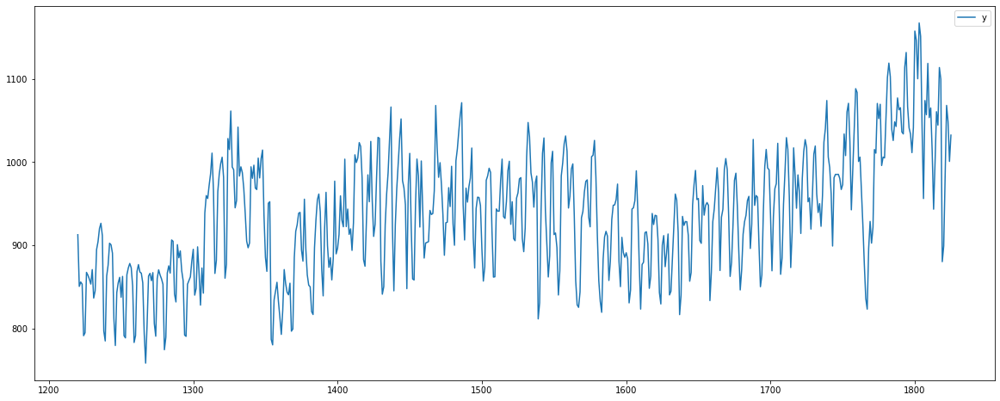

In [145]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h5.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:46 - cmdstanpy - INFO - Chain [1] start processing
22:33:46 - cmdstanpy - INFO - Chain [1] done processing


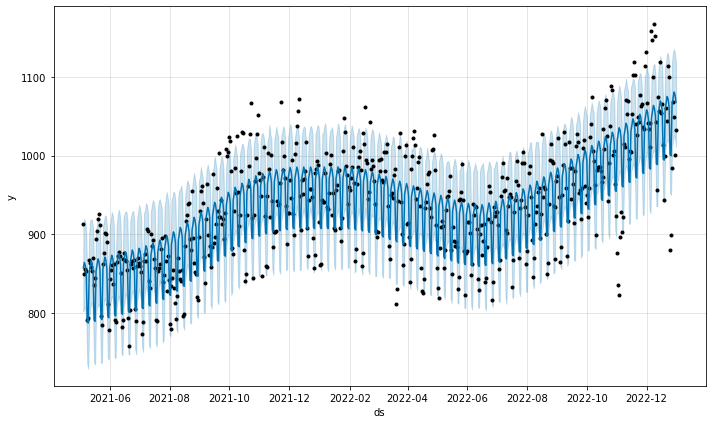

In [146]:
# Entrenamiento co el modelo PROPHET
model_prophet_h5 = Prophet()
model_prophet_h5.fit(entrenamient_h5)

forecast_h5 = model_prophet_h5.predict()
fig_h5 = model_prophet_h5.plot(forecast_h5)

In [147]:
# Predicción 10 dias 
future_data_h5 = model_prophet_h5.make_future_dataframe(periods=10)
prueba_h5 = model_prophet_h5.predict(future_data_h5)

test_prueba_h5 = prueba_h5['yhat']
# mostrar resultados
test_prueba_h5.tail(12)

604    1077.410417
605    1067.396288
606    1006.937849
607    1005.620521
608    1070.279513
609    1078.723502
610    1086.316874
611    1083.075441
612    1073.061312
613    1012.602873
614    1011.285545
615    1075.944536
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 6:00

In [148]:
# se elige las columas a utilizar 
datah6=data[['FECHA','H6']]
datah6.head()

,FECHA,H6
0,2018-06-19,840.86665
1,2018-06-20,842.74600
2,2018-06-21,809.09779
3,2018-06-22,819.11030
4,2018-06-23,825.81000


In [149]:
# Cambiamos el Nombre de las Columnas
entrh6 = datah6.copy()
entrh6.columns = ['ds','y']
entrenamient_h6 = entrh6[1220:]
entrenamient_h6.head()

,ds,y
1220,2021-05-05,955.28
1221,2021-05-06,912.16
1222,2021-05-07,909.01
1223,2021-05-08,891.86
1224,2021-05-09,807.98


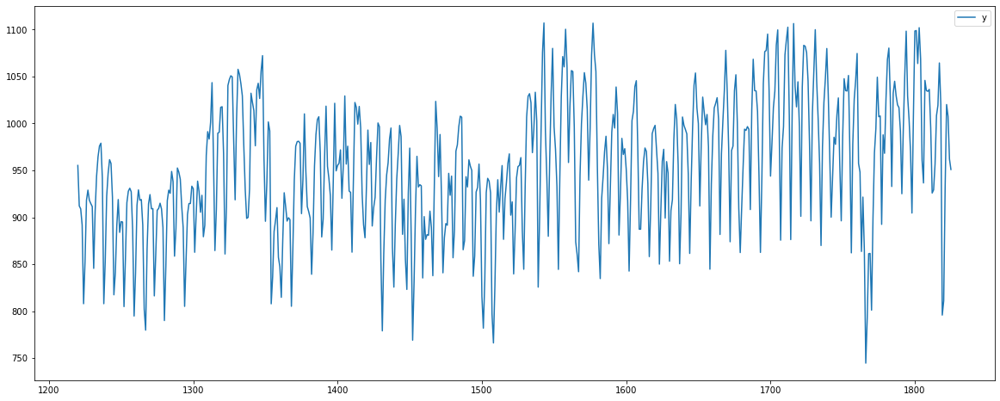

In [150]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h6.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:48 - cmdstanpy - INFO - Chain [1] start processing
22:33:48 - cmdstanpy - INFO - Chain [1] done processing


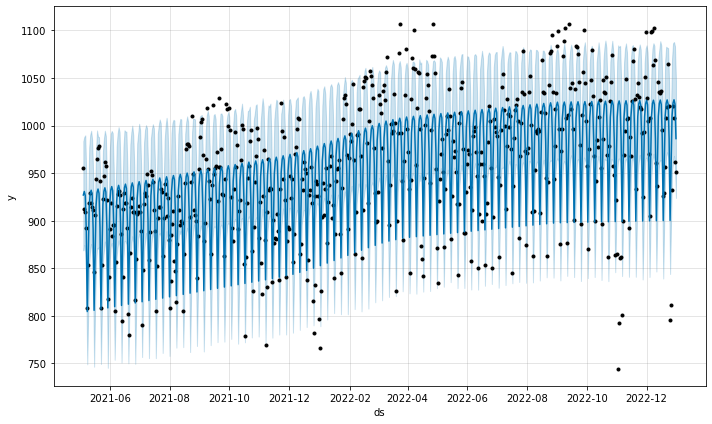

In [151]:
# Entrenamiento co el modelo PROPHET
model_prophet_h6 = Prophet()
model_prophet_h6.fit(entrenamient_h6)

forecast_h6 = model_prophet_h6.predict()
fig_h6 = model_prophet_h6.plot(forecast_h6)

In [152]:
# Predicción 10 dias 
future_data_h6 = model_prophet_h6.make_future_dataframe(periods=10)
prueba_h6 = model_prophet_h6.predict(future_data_h6)

test_prueba_h6 = prueba_h6['yhat']
# mostrar resultados
test_prueba_h6.tail(12)

604    1022.534894
605     986.276724
606     900.420030
607     955.873606
608    1010.251934
609    1023.690968
610    1027.256106
611    1022.685140
612     986.426970
613     900.570275
614     956.023852
615    1010.402179
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 7:00

In [153]:
# se elige las columas a utilizar 
datah7=data[['FECHA','H7']]
datah7.head()

,FECHA,H7
0,2018-06-19,913.12915
1,2018-06-20,939.34800
2,2018-06-21,765.19724
3,2018-06-22,909.09767
4,2018-06-23,824.88000


In [154]:
# Cambiamos el Nombre de las Columnas
entrh7 = datah7.copy()
entrh7.columns = ['ds','y']
entrenamient_h7 = entrh7[1220:]
entrenamient_h7.head()

,ds,y
1220,2021-05-05,988.839
1221,2021-05-06,941.956
1222,2021-05-07,942.005
1223,2021-05-08,862.272
1224,2021-05-09,740.440


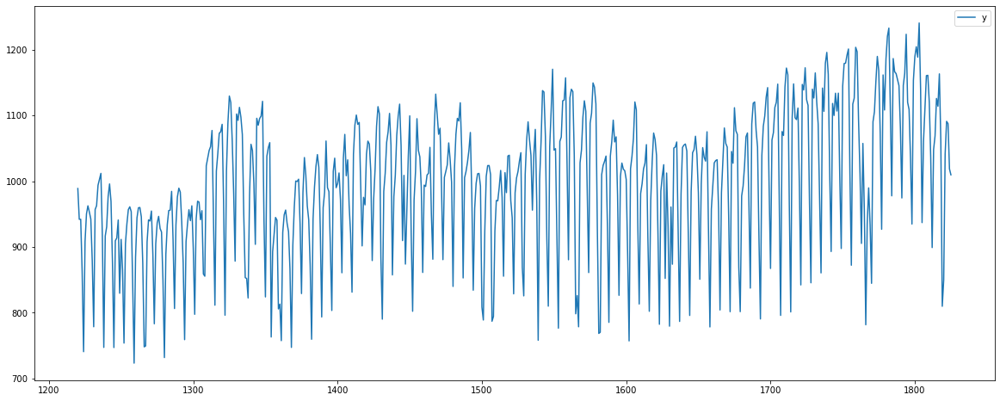

In [155]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h7.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:50 - cmdstanpy - INFO - Chain [1] start processing
22:33:50 - cmdstanpy - INFO - Chain [1] done processing


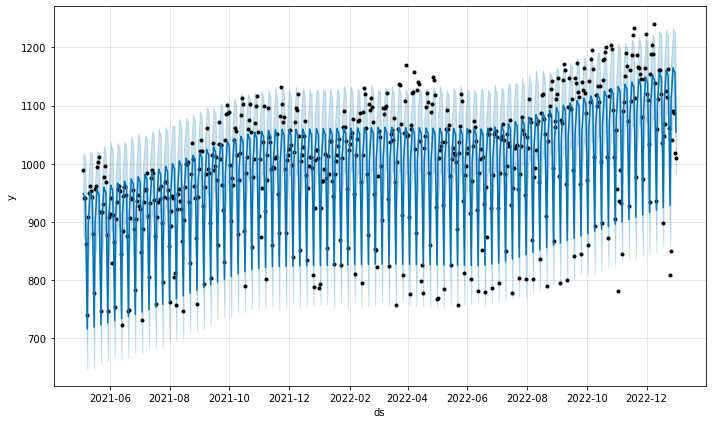

In [156]:
# Entrenamiento co el modelo PROPHET
model_prophet_h7 = Prophet()
model_prophet_h7.fit(entrenamient_h7)

forecast_h7 = model_prophet_h7.predict()
fig_h7 = model_prophet_h7.plot(forecast_h7)

In [157]:
# Predicción 10 dias 
future_data_h7 = model_prophet_h7.make_future_dataframe(periods=10)
prueba_h7 = model_prophet_h7.predict(future_data_h7)

test_prueba_h7 = prueba_h7['yhat']
# mostrar resultados
test_prueba_h7.tail(12)

604    1156.177039
605    1054.822456
606     932.450376
607    1113.239135
608    1139.466721
609    1169.036238
610    1164.118572
611    1160.207253
612    1058.852670
613     936.480590
614    1117.269349
615    1143.496935
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 8:00

In [158]:
# se elige las columas a utilizar 
datah8=data[['FECHA','H8']]
datah8.head()

,FECHA,H8
0,2018-06-19,1006.86998
1,2018-06-20,1023.46400
2,2018-06-21,825.54627
3,2018-06-22,1016.89217
4,2018-06-23,917.65600


In [159]:
# Cambiamos el Nombre de las Columnas
entrh8 = datah8.copy()
entrh8.columns = ['ds','y']
entrenamient_h8 = entrh8[1220:]
entrenamient_h8.head()

,ds,y
1220,2021-05-05,1075.081
1221,2021-05-06,1029.481
1222,2021-05-07,1031.471
1223,2021-05-08,946.729
1224,2021-05-09,798.024


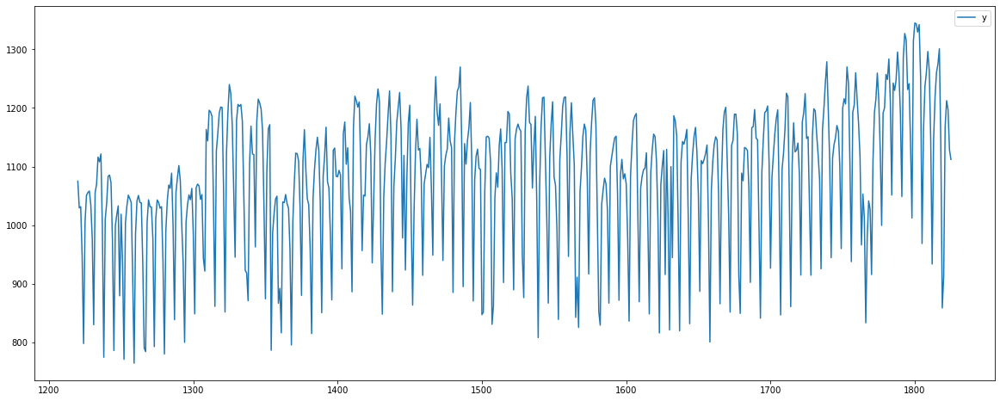

In [160]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h8.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:51 - cmdstanpy - INFO - Chain [1] start processing
22:33:51 - cmdstanpy - INFO - Chain [1] done processing


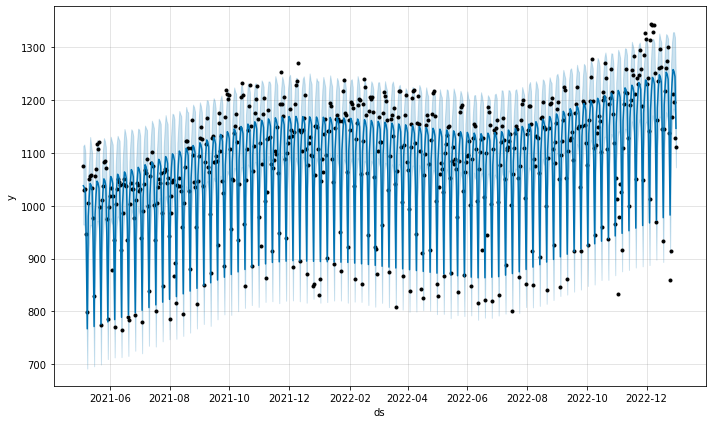

In [161]:
# Entrenamiento co el modelo PROPHET
model_prophet_h8 = Prophet()
model_prophet_h8.fit(entrenamient_h8)

forecast_h8 = model_prophet_h8.predict()
fig_h8 = model_prophet_h8.plot(forecast_h8)

In [162]:
# Predicción 10 dias 
future_data_h8 = model_prophet_h8.make_future_dataframe(periods=10)
prueba_h8 = model_prophet_h8.predict(future_data_h8)

test_prueba_h8 = prueba_h8['yhat']
# mostrar resultados
test_prueba_h8.tail(12)

604    1244.822547
605    1146.725821
606     987.385940
607    1200.605398
608    1237.572748
609    1262.974117
610    1259.528016
611    1249.765000
612    1151.668274
613     992.328393
614    1205.547851
615    1242.515201
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 9:00

In [163]:
# se elige las columas a utilizar 
datah9=data[['FECHA','H9']]
datah9.head()

,FECHA,H9
0,2018-06-19,1061.87509
1,2018-06-20,1075.55300
2,2018-06-21,905.19986
3,2018-06-22,1067.76600
4,2018-06-23,997.94600


In [164]:
# Cambiamos el Nombre de las Columnas
entrh9 = datah9.copy()
entrh9.columns = ['ds','y']
entrenamient_h9 = entrh9[1220:]
entrenamient_h9.head()

,ds,y
1220,2021-05-05,1133.168
1221,2021-05-06,1110.080
1222,2021-05-07,1111.370
1223,2021-05-08,1036.782
1224,2021-05-09,856.897


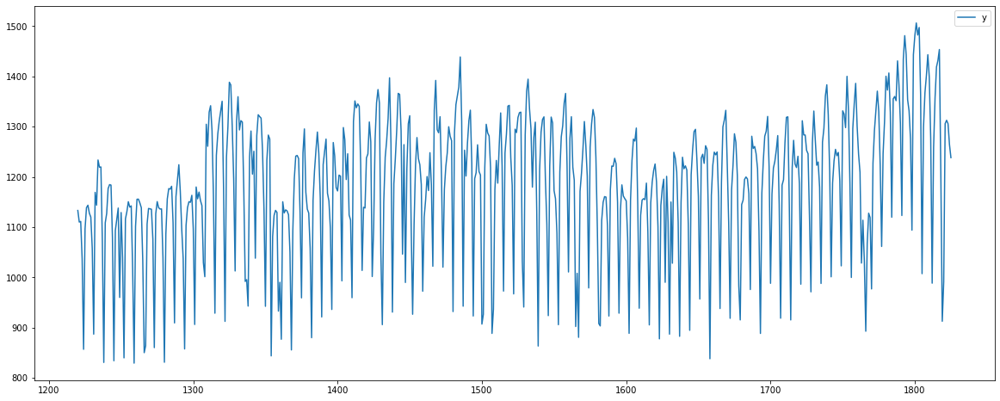

In [165]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h9.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:53 - cmdstanpy - INFO - Chain [1] start processing
22:33:53 - cmdstanpy - INFO - Chain [1] done processing


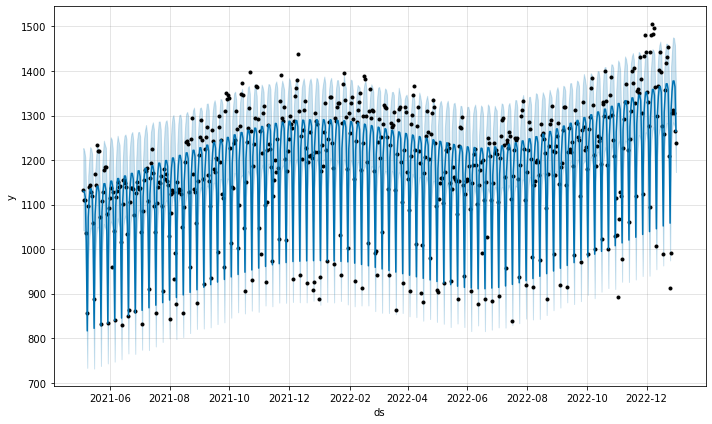

In [166]:
# Entrenamiento co el modelo PROPHET
model_prophet_h9 = Prophet()
model_prophet_h9.fit(entrenamient_h9)

forecast_h9 = model_prophet_h9.predict()
fig_h9 = model_prophet_h9.plot(forecast_h9)

In [167]:
# Predicción 10 dias 
future_data_h9 = model_prophet_h9.make_future_dataframe(periods=10)
prueba_h9 = model_prophet_h9.predict(future_data_h9)

test_prueba_h9 = prueba_h9['yhat']
# mostrar resultados
test_prueba_h9.tail(12)

604    1364.636830
605    1264.535467
606    1064.536503
607    1319.723787
608    1361.027290
609    1383.809629
610    1383.885834
611    1370.966940
612    1270.865577
613    1070.866613
614    1326.053897
615    1367.357400
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 10:00

In [168]:
# se elige las columas a utilizar 
datah10=data[['FECHA','H10']]
datah10.head()

,FECHA,H10
0,2018-06-19,1084.66400
1,2018-06-20,1087.82700
2,2018-06-21,941.43900
3,2018-06-22,1086.68795
4,2018-06-23,1034.96900


In [169]:
# Cambiamos el Nombre de las Columnas
entrh10 = datah10.copy()
entrh10.columns = ['ds','y']
entrenamient_h10 = entrh10[1220:]
entrenamient_h10.head()

,ds,y
1220,2021-05-05,1163.605
1221,2021-05-06,1132.676
1222,2021-05-07,1143.839
1223,2021-05-08,1075.291
1224,2021-05-09,897.059


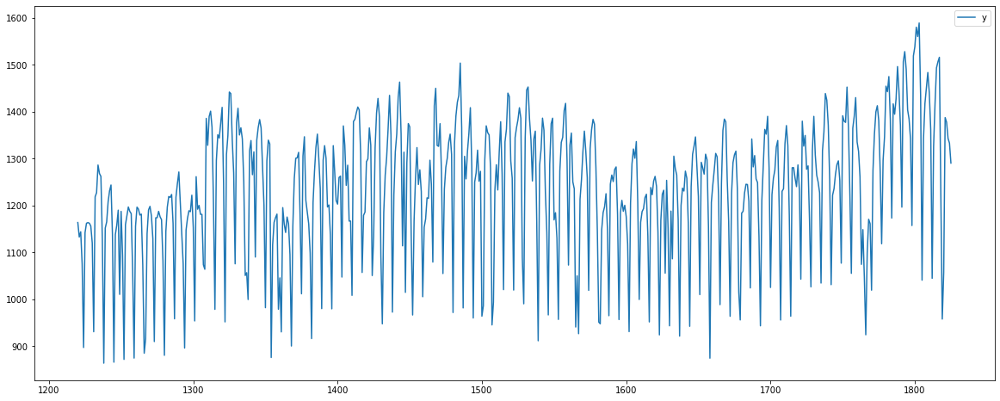

In [170]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h10.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:54 - cmdstanpy - INFO - Chain [1] start processing
22:33:55 - cmdstanpy - INFO - Chain [1] done processing


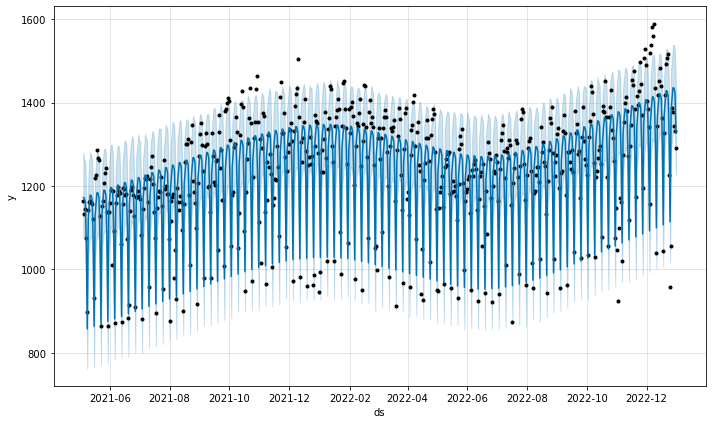

In [171]:
# Entrenamiento co el modelo PROPHET
model_prophet_h10 = Prophet()
model_prophet_h10.fit(entrenamient_h10)

forecast_h10 = model_prophet_h10.predict()
fig_h10 = model_prophet_h10.plot(forecast_h10)

In [172]:
# Predicción 10 dias 
future_data_h10 = model_prophet_h10.make_future_dataframe(periods=10)
prueba_h10 = model_prophet_h10.predict(future_data_h10)

test_prueba_h10 = prueba_h10['yhat']
# mostrar resultados
test_prueba_h10.tail(12)

604    1423.699978
605    1327.119943
606    1121.429172
607    1384.830593
608    1417.692014
609    1442.844396
610    1441.648391
611    1430.906932
612    1334.326897
613    1128.636126
614    1392.037547
615    1424.898969
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 11:00

In [173]:
# se elige las columas a utilizar 
datah11=data[['FECHA','H11']]
datah11.head()

,FECHA,H11
0,2018-06-19,1103.70178
1,2018-06-20,1108.20800
2,2018-06-21,965.71475
3,2018-06-22,1132.36612
4,2018-06-23,1041.84000


In [174]:
# Cambiamos el Nombre de las Columnas
entrh11 = datah11.copy()
entrh11.columns = ['ds','y']
entrenamient_h11 = entrh11[1220:]
entrenamient_h11.head()

,ds,y
1220,2021-05-05,1206.875
1221,2021-05-06,1151.692
1222,2021-05-07,1157.998
1223,2021-05-08,1096.582
1224,2021-05-09,927.847


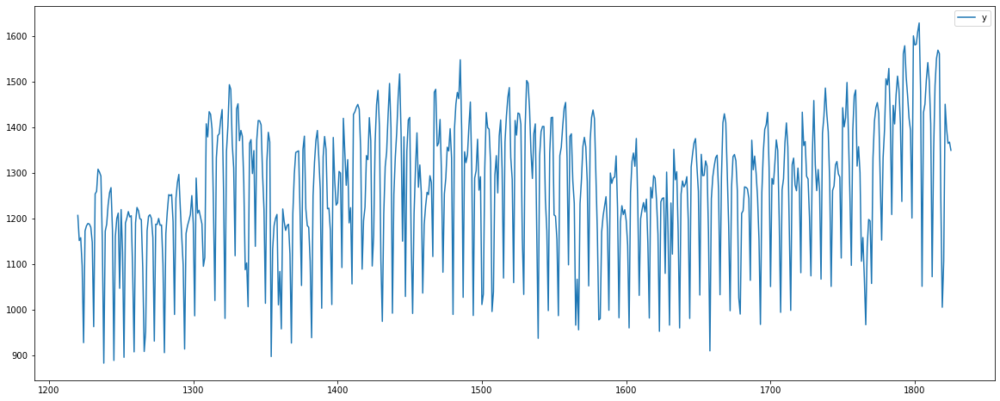

In [175]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h11.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:56 - cmdstanpy - INFO - Chain [1] start processing
22:33:56 - cmdstanpy - INFO - Chain [1] done processing


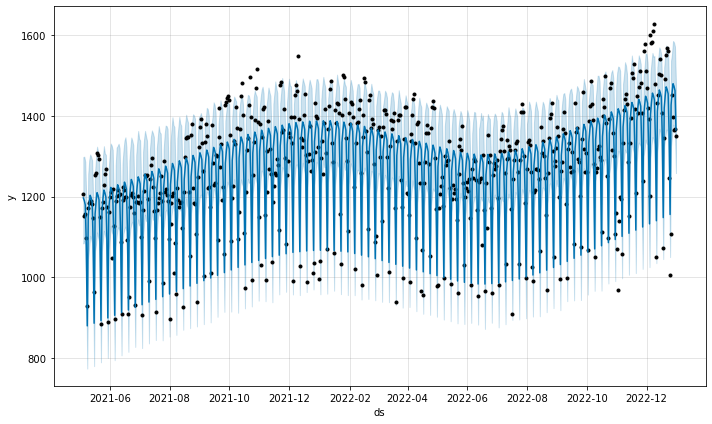

In [176]:
# Entrenamiento co el modelo PROPHET
model_prophet_h11 = Prophet()
model_prophet_h11.fit(entrenamient_h11)

forecast_h11 = model_prophet_h11.predict()
fig_h11 = model_prophet_h11.plot(forecast_h11)

In [177]:
# Predicción 10 dias 
future_data_h11 = model_prophet_h11.make_future_dataframe(periods=10)
prueba_h11 = model_prophet_h11.predict(future_data_h11)

test_prueba_h11 = prueba_h11['yhat']
# mostrar resultados
test_prueba_h11.tail(12)

604    1462.914838
605    1365.287369
606    1163.342238
607    1435.007638
608    1464.790219
609    1487.672175
610    1481.228505
611    1470.678620
612    1373.051152
613    1171.106021
614    1442.771421
615    1472.554002
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 12:00

In [178]:
# se elige las columas a utilizar 
datah12=data[['FECHA','H12']]
datah12.head()

,FECHA,H12
0,2018-06-19,1082.72739
1,2018-06-20,1100.56100
2,2018-06-21,968.62748
3,2018-06-22,1114.81595
4,2018-06-23,1040.92700


In [179]:
# Cambiamos el Nombre de las Columnas
entrh12 = datah12.copy()
entrh12.columns = ['ds','y']
entrenamient_h12 = entrh12[1220:]
entrenamient_h12.head()

,ds,y
1220,2021-05-05,1187.092
1221,2021-05-06,1147.559
1222,2021-05-07,1148.460
1223,2021-05-08,1090.220
1224,2021-05-09,928.033


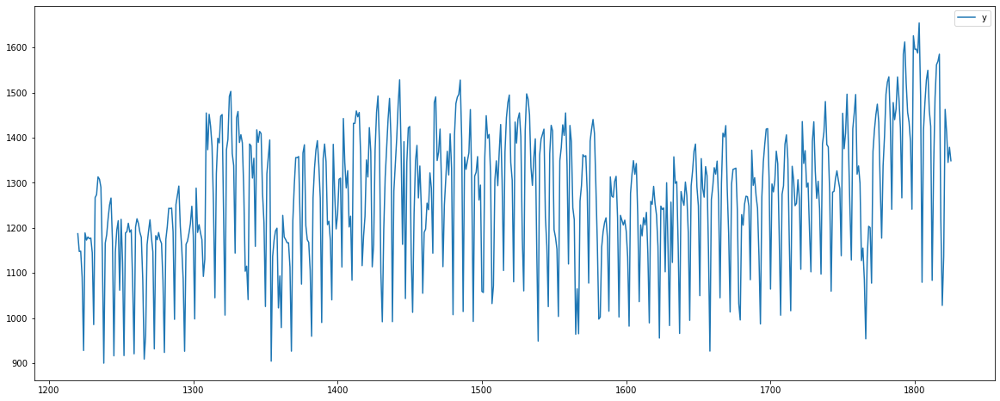

In [180]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h12.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:33:58 - cmdstanpy - INFO - Chain [1] start processing
22:33:58 - cmdstanpy - INFO - Chain [1] done processing


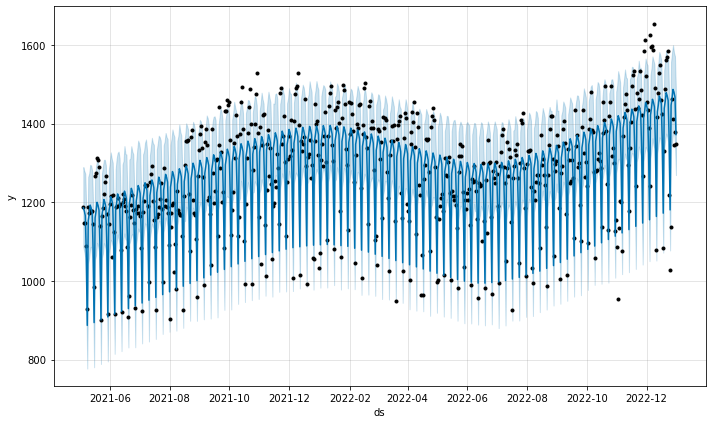

In [181]:
# Entrenamiento co el modelo PROPHET
model_prophet_h12 = Prophet()
model_prophet_h12.fit(entrenamient_h12)

forecast_h12 = model_prophet_h12.predict()
fig_h12 = model_prophet_h12.plot(forecast_h12)

In [182]:
# Predicción 10 dias 
future_data_h12 = model_prophet_h12.make_future_dataframe(periods=10)
prueba_h12 = model_prophet_h12.predict(future_data_h12)

test_prueba_h12 = prueba_h12['yhat']
# mostrar resultados
test_prueba_h12.tail(12)

604    1467.710995
605    1372.345123
606    1189.193872
607    1455.585816
608    1472.817001
609    1495.534582
610    1488.209551
611    1476.075993
612    1380.710121
613    1197.558870
614    1463.950814
615    1481.181998
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 13:00

In [183]:
# se elige las columas a utilizar 
datah13=data[['FECHA','H13']]
datah13.head()

,FECHA,H13
0,2018-06-19,1040.78100
1,2018-06-20,1047.14600
2,2018-06-21,937.36881
3,2018-06-22,1063.44910
4,2018-06-23,997.31200


In [184]:
# Cambiamos el Nombre de las Columnas
entrh13 = datah13.copy()
entrh13.columns = ['ds','y']
entrenamient_h13 = entrh13[1220:]
entrenamient_h13.head()

,ds,y
1220,2021-05-05,1158.693
1221,2021-05-06,1111.301
1222,2021-05-07,1110.269
1223,2021-05-08,1046.867
1224,2021-05-09,923.256


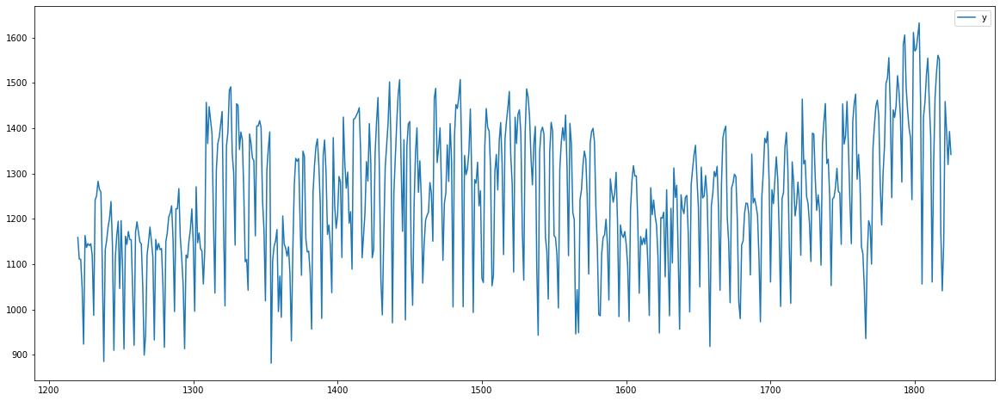

In [185]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h13.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:00 - cmdstanpy - INFO - Chain [1] start processing
22:34:00 - cmdstanpy - INFO - Chain [1] done processing


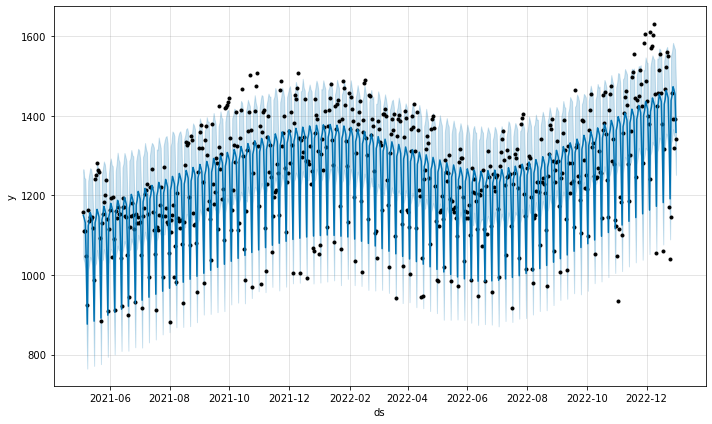

In [186]:
# Entrenamiento co el modelo PROPHET
model_prophet_h13 = Prophet()
model_prophet_h13.fit(entrenamient_h13)

forecast_h13 = model_prophet_h13.predict()
fig_h13 = model_prophet_h13.plot(forecast_h13)

In [187]:
# Predicción 10 dias 
future_data_h13 = model_prophet_h13.make_future_dataframe(periods=10)
prueba_h13 = model_prophet_h13.predict(future_data_h13)

test_prueba_h13 = prueba_h13['yhat']
# mostrar resultados
test_prueba_h13.tail(12)

604    1454.870511
605    1358.557969
606    1200.789816
607    1448.172191
608    1460.515845
609    1482.748264
610    1474.526548
611    1464.279482
612    1367.966940
613    1210.198787
614    1457.581162
615    1469.924816
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 14:00

In [188]:
# se elige las columas a utilizar 
datah14=data[['FECHA','H14']]
datah14.head()

,FECHA,H14
0,2018-06-19,1073.69673
1,2018-06-20,1075.64200
2,2018-06-21,947.52831
3,2018-06-22,1091.92100
4,2018-06-23,993.26200


In [189]:
# Cambiamos el Nombre de las Columnas
entrh14 = datah14.copy()
entrh14.columns = ['ds','y']
entrenamient_h14 = entrh14[1220:]
entrenamient_h14.head()

,ds,y
1220,2021-05-05,1184.283
1221,2021-05-06,1137.057
1222,2021-05-07,1133.870
1223,2021-05-08,1055.887
1224,2021-05-09,924.794


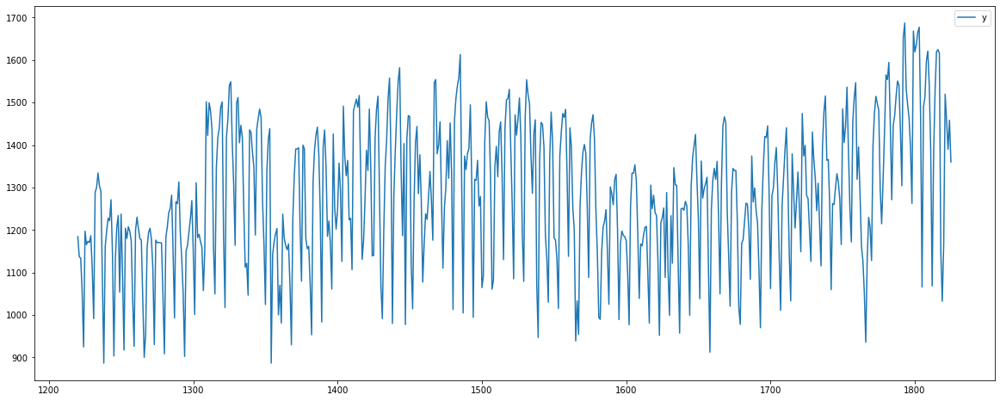

In [190]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h14.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:02 - cmdstanpy - INFO - Chain [1] start processing
22:34:02 - cmdstanpy - INFO - Chain [1] done processing


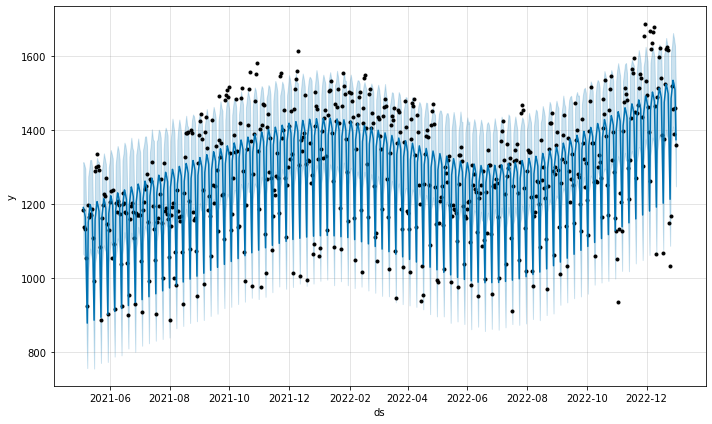

In [191]:
# Entrenamiento co el modelo PROPHET
model_prophet_h14 = Prophet()
model_prophet_h14.fit(entrenamient_h14)

forecast_h14 = model_prophet_h14.predict()
fig_h14 = model_prophet_h14.plot(forecast_h14)

In [192]:
# Predicción 10 dias 
future_data_h14 = model_prophet_h14.make_future_dataframe(periods=10)
prueba_h14 = model_prophet_h14.predict(future_data_h14)

test_prueba_h14 = prueba_h14['yhat']
# mostrar resultados
test_prueba_h14.tail(12)

604    1509.072248
605    1374.182977
606    1223.699431
607    1496.179074
608    1521.436744
609    1544.945306
610    1534.523278
611    1519.676579
612    1384.787309
613    1234.303763
614    1506.783405
615    1532.041076
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 15:00

In [193]:
# se elige las columas a utilizar 
datah15=data[['FECHA','H15']]
datah15.head()

,FECHA,H15
0,2018-06-19,1117.92458
1,2018-06-20,1119.15700
2,2018-06-21,967.22967
3,2018-06-22,1132.91900
4,2018-06-23,1009.15600


In [194]:
# Cambiamos el Nombre de las Columnas
entrh15 = datah15.copy()
entrh15.columns = ['ds','y']
entrenamient_h15 = entrh15[1220:]
entrenamient_h15.head()

,ds,y
1220,2021-05-05,1203.705
1221,2021-05-06,1150.763
1222,2021-05-07,1153.753
1223,2021-05-08,1055.978
1224,2021-05-09,936.760


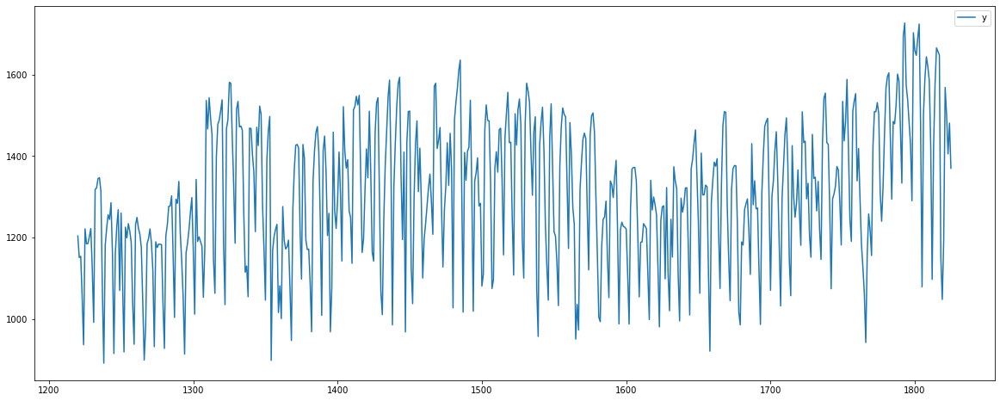

In [195]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h15.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:03 - cmdstanpy - INFO - Chain [1] start processing
22:34:04 - cmdstanpy - INFO - Chain [1] done processing


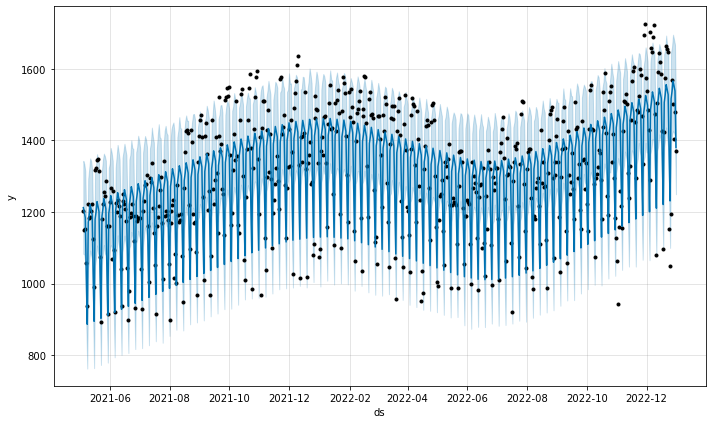

In [196]:
# Entrenamiento co el modelo PROPHET
model_prophet_h15 = Prophet()
model_prophet_h15.fit(entrenamient_h15)

forecast_h15 = model_prophet_h15.predict()
fig_h15 = model_prophet_h15.plot(forecast_h15)

In [197]:
# Predicción 10 dias 
future_data_h15 = model_prophet_h15.make_future_dataframe(periods=10)
prueba_h15 = model_prophet_h15.predict(future_data_h15)

test_prueba_h15 = prueba_h15['yhat']
# mostrar resultados
test_prueba_h15.tail(12)

604    1538.213850
605    1380.595203
606    1240.908512
607    1526.318925
608    1547.206575
609    1576.050761
610    1562.972470
611    1548.320483
612    1390.701836
613    1251.015145
614    1536.425558
615    1557.313208
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 16:00

In [198]:
# se elige las columas a utilizar 
datah16=data[['FECHA','H16']]
datah16.head()

,FECHA,H16
0,2018-06-19,1114.15208
1,2018-06-20,1110.12900
2,2018-06-21,952.41426
3,2018-06-22,1126.98700
4,2018-06-23,992.78300


In [199]:
# Cambiamos el Nombre de las Columnas
entrh16 = datah16.copy()
entrh16.columns = ['ds','y']
entrenamient_h16 = entrh16[1220:]
entrenamient_h16.head()

,ds,y
1220,2021-05-05,1191.033
1221,2021-05-06,1148.820
1222,2021-05-07,1146.951
1223,2021-05-08,1044.885
1224,2021-05-09,953.022


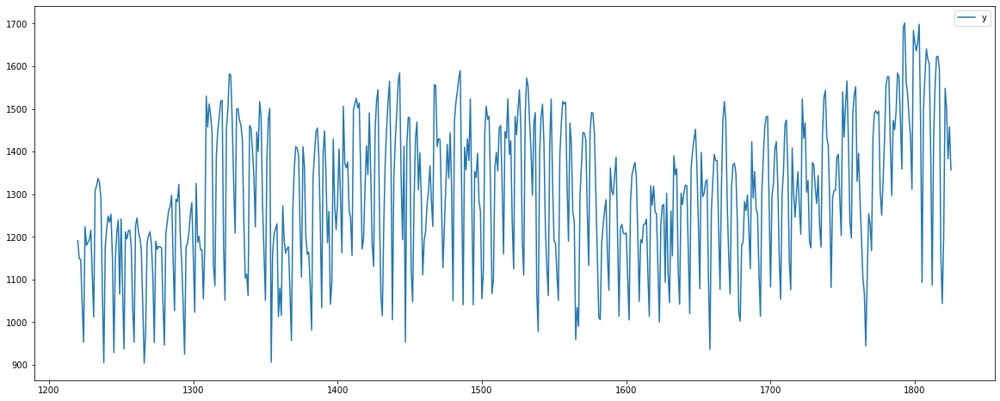

In [200]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h16.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:05 - cmdstanpy - INFO - Chain [1] start processing
22:34:05 - cmdstanpy - INFO - Chain [1] done processing


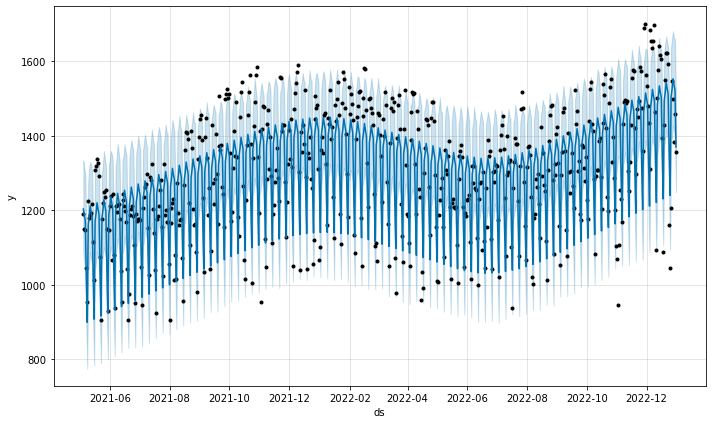

In [201]:
# Entrenamiento co el modelo PROPHET
model_prophet_h16 = Prophet()
model_prophet_h16.fit(entrenamient_h16)

forecast_h16 = model_prophet_h16.predict()
fig_h16 = model_prophet_h16.plot(forecast_h16)

In [202]:
# Predicción 10 dias 
future_data_h16 = model_prophet_h16.make_future_dataframe(periods=10)
prueba_h16 = model_prophet_h16.predict(future_data_h16)

test_prueba_h16 = prueba_h16['yhat']
# mostrar resultados
test_prueba_h16.tail(12)

604    1522.787606
605    1369.912285
606    1249.624636
607    1513.326554
608    1534.140338
609    1562.900419
610    1546.176757
611    1532.368077
612    1379.492756
613    1259.205108
614    1522.907025
615    1543.720809
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 17:00

In [203]:
# se elige las columas a utilizar 
datah17=data[['FECHA','H17']]
datah17.head()

,FECHA,H17
0,2018-06-19,1108.293
1,2018-06-20,1098.810
2,2018-06-21,960.886
3,2018-06-22,1121.117
4,2018-06-23,990.660


In [204]:
# Cambiamos el Nombre de las Columnas
entrh17 = datah17.copy()
entrh17.columns = ['ds','y']
entrenamient_h17 = entrh17[1220:]
entrenamient_h17.head()

,ds,y
1220,2021-05-05,1169.101
1221,2021-05-06,1150.858
1222,2021-05-07,1128.447
1223,2021-05-08,1042.909
1224,2021-05-09,961.386


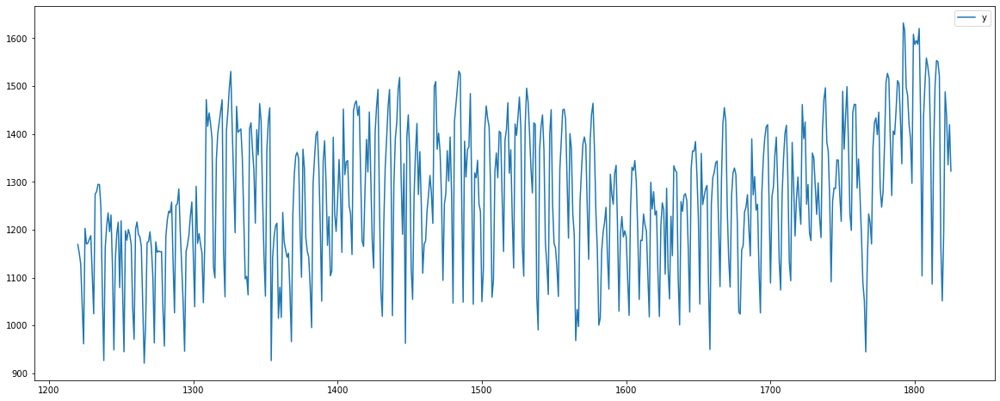

In [205]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h17.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:07 - cmdstanpy - INFO - Chain [1] start processing
22:34:07 - cmdstanpy - INFO - Chain [1] done processing


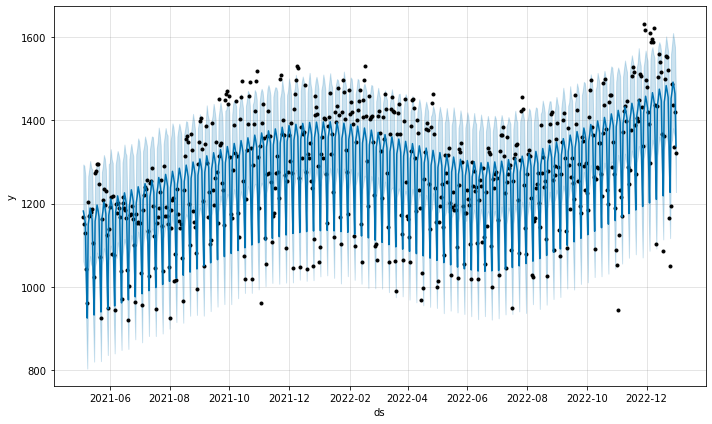

In [206]:
# Entrenamiento co el modelo PROPHET
model_prophet_h17 = Prophet()
model_prophet_h17.fit(entrenamient_h17)

forecast_h17 = model_prophet_h17.predict()
fig_h17 = model_prophet_h17.plot(forecast_h17)

In [207]:
# Predicción 10 dias 
future_data_h17 = model_prophet_h17.make_future_dataframe(periods=10)
prueba_h17 = model_prophet_h17.predict(future_data_h17)

test_prueba_h17 = prueba_h17['yhat']
# mostrar resultados
test_prueba_h17.tail(12)

604    1463.754342
605    1338.255387
606    1235.534381
607    1460.733151
608    1477.479197
609    1500.228914
610    1488.192885
611    1472.236886
612    1346.737931
613    1244.016925
614    1469.215695
615    1485.961741
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 18:00

In [208]:
# se elige las columas a utilizar 
datah18=data[['FECHA','H18']]
datah18.head()

,FECHA,H18
0,2018-06-19,1195.74200
1,2018-06-20,1167.80600
2,2018-06-21,1052.84119
3,2018-06-22,1201.86000
4,2018-06-23,1079.58000


In [209]:
# Cambiamos el Nombre de las Columnas
entrh18 = datah18.copy()
entrh18.columns = ['ds','y']
entrenamient_h18 = entrh18[1220:]
entrenamient_h18.head()

,ds,y
1220,2021-05-05,1236.59
1221,2021-05-06,1226.35
1222,2021-05-07,1220.03
1223,2021-05-08,1114.17
1224,2021-05-09,1034.39


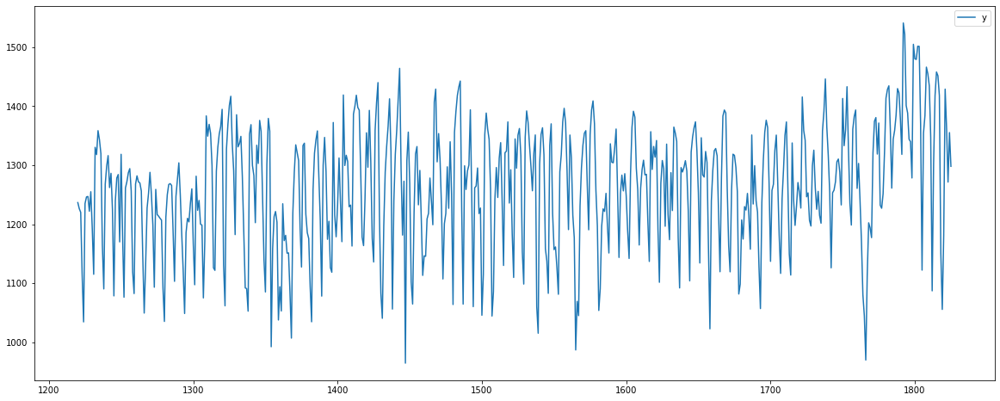

In [210]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h18.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:09 - cmdstanpy - INFO - Chain [1] start processing
22:34:09 - cmdstanpy - INFO - Chain [1] done processing


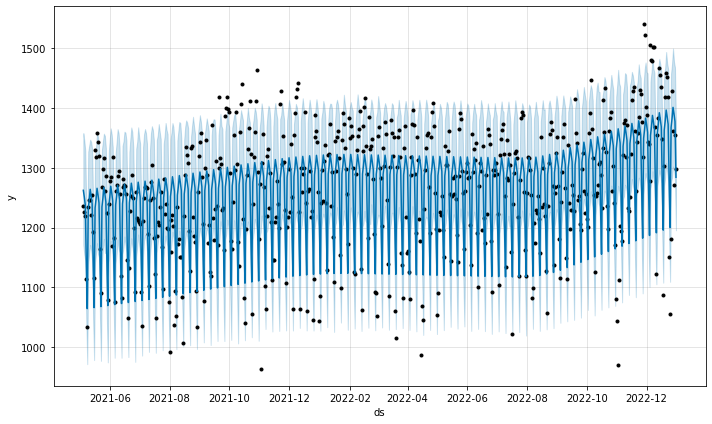

In [211]:
# Entrenamiento co el modelo PROPHET
model_prophet_h18 = Prophet()
model_prophet_h18.fit(entrenamient_h18)

forecast_h18 = model_prophet_h18.predict()
fig_h18 = model_prophet_h18.plot(forecast_h18)

In [212]:
# Predicción 10 dias 
future_data_h18 = model_prophet_h18.make_future_dataframe(periods=10)
prueba_h18 = model_prophet_h18.predict(future_data_h18)

test_prueba_h18 = prueba_h18['yhat']
# mostrar resultados
test_prueba_h18.tail(12)

604    1377.288641
605    1284.175054
606    1204.821409
607    1371.960878
608    1386.858393
609    1405.499042
610    1394.752866
611    1381.764244
612    1288.650657
613    1209.297012
614    1376.436481
615    1391.333996
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 19:00

In [213]:
# se elige las columas a utilizar 
datah19=data[['FECHA','H19']]
datah19.head()

,FECHA,H19
0,2018-06-19,1382.98300
1,2018-06-20,1363.73400
2,2018-06-21,1282.68365
3,2018-06-22,1370.64000
4,2018-06-23,1300.04000


In [214]:
# Cambiamos el Nombre de las Columnas
entrh19 = datah19.copy()
entrh19.columns = ['ds','y']
entrenamient_h19 = entrh19[1220:]
entrenamient_h19.head()

,ds,y
1220,2021-05-05,1421.93
1221,2021-05-06,1400.64
1222,2021-05-07,1366.83
1223,2021-05-08,1330.82
1224,2021-05-09,1273.69


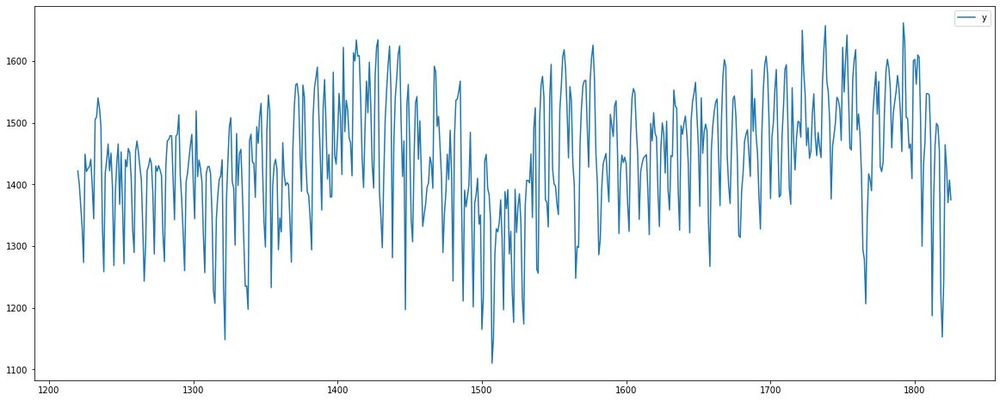

In [215]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h19.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:11 - cmdstanpy - INFO - Chain [1] start processing
22:34:11 - cmdstanpy - INFO - Chain [1] done processing


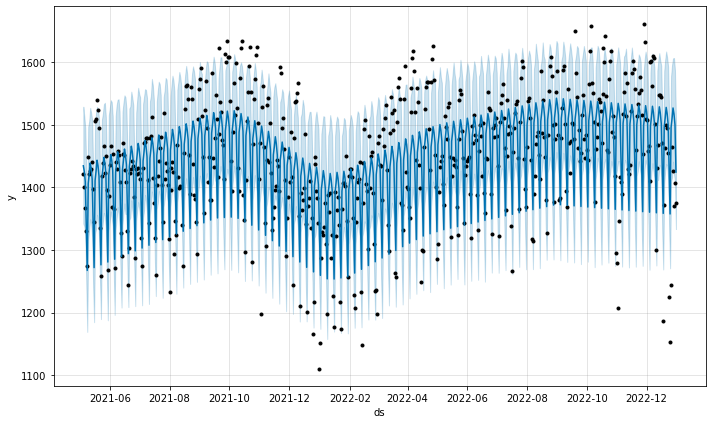

In [216]:
# Entrenamiento co el modelo PROPHET
model_prophet_h19 = Prophet()
model_prophet_h19.fit(entrenamient_h19)

forecast_h19 = model_prophet_h19.predict()
fig_h19 = model_prophet_h19.plot(forecast_h19)

In [217]:
# Predicción 10 dias 
future_data_h19 = model_prophet_h19.make_future_dataframe(periods=10)
prueba_h19 = model_prophet_h19.predict(future_data_h19)

test_prueba_h19 = prueba_h19['yhat']
# mostrar resultados
test_prueba_h19.tail(12)

604    1500.073120
605    1424.481658
606    1356.595822
607    1494.932365
608    1509.183810
609    1526.037044
610    1516.250987
611    1499.152629
612    1423.561168
613    1355.675331
614    1494.011874
615    1508.263319
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 20:00

In [218]:
# se elige las columas a utilizar 
datah20=data[['FECHA','H20']]
datah20.head()

,FECHA,H20
0,2018-06-19,1378.293
1,2018-06-20,1352.600
2,2018-06-21,1283.712
3,2018-06-22,1352.140
4,2018-06-23,1279.740


In [219]:
# Cambiamos el Nombre de las Columnas
entrh20 = datah20.copy()
entrh20.columns = ['ds','y']
entrenamient_h20 = entrh20[1220:]
entrenamient_h20.head()

,ds,y
1220,2021-05-05,1398.71
1221,2021-05-06,1384.85
1222,2021-05-07,1353.93
1223,2021-05-08,1317.44
1224,2021-05-09,1270.78


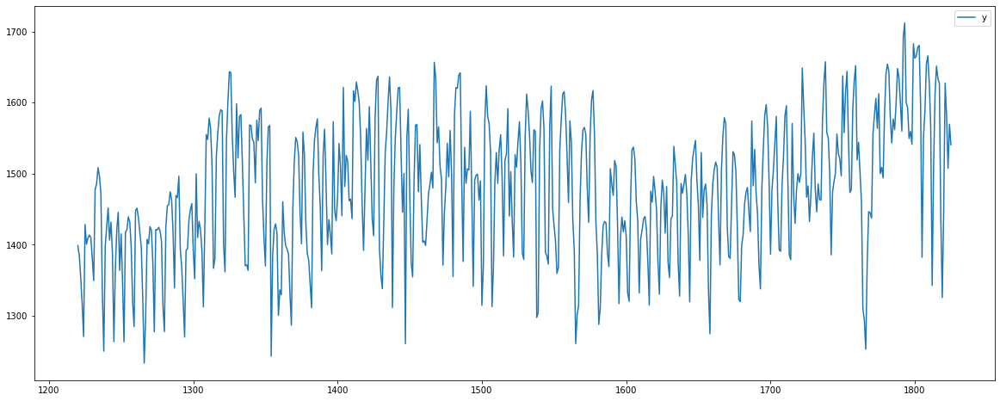

In [220]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h20.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:13 - cmdstanpy - INFO - Chain [1] start processing
22:34:13 - cmdstanpy - INFO - Chain [1] done processing


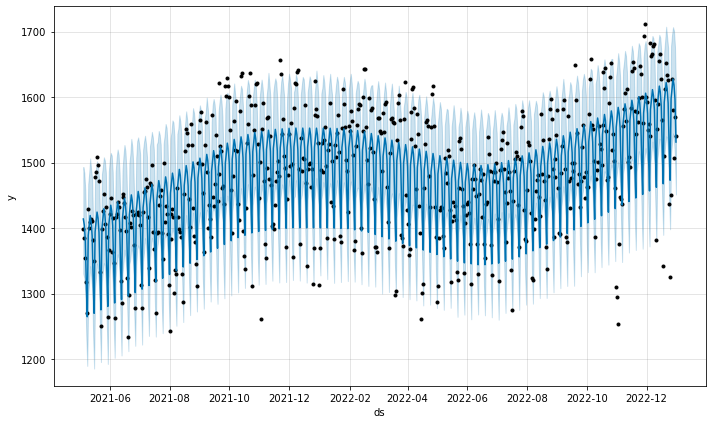

In [221]:
# Entrenamiento co el modelo PROPHET
model_prophet_h20 = Prophet()
model_prophet_h20.fit(entrenamient_h20)

forecast_h20 = model_prophet_h20.predict()
fig_h20 = model_prophet_h20.plot(forecast_h20)

In [222]:
# Predicción 10 dias 
future_data_h20 = model_prophet_h20.make_future_dataframe(periods=10)
prueba_h20 = model_prophet_h20.predict(future_data_h20)

test_prueba_h20 = prueba_h20['yhat']
# mostrar resultados
test_prueba_h20.tail(12)

604    1596.435689
605    1531.286819
606    1478.405277
607    1602.779130
608    1617.738666
609    1632.990221
610    1623.828602
611    1601.854136
612    1536.705266
613    1483.823724
614    1608.197577
615    1623.157113
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 21:00

In [223]:
# se elige las columas a utilizar 
datah21=data[['FECHA','H21']]
datah21.head()

,FECHA,H21
0,2018-06-19,1334.45900
1,2018-06-20,1291.22000
2,2018-06-21,1255.32375
3,2018-06-22,1299.94000
4,2018-06-23,1240.52000


In [224]:
# Cambiamos el Nombre de las Columnas
entrh21 = datah21.copy()
entrh21.columns = ['ds','y']
entrenamient_h21 = entrh21[1220:]
entrenamient_h21.head()

,ds,y
1220,2021-05-05,1343.24
1221,2021-05-06,1330.08
1222,2021-05-07,1304.91
1223,2021-05-08,1264.23
1224,2021-05-09,1237.84


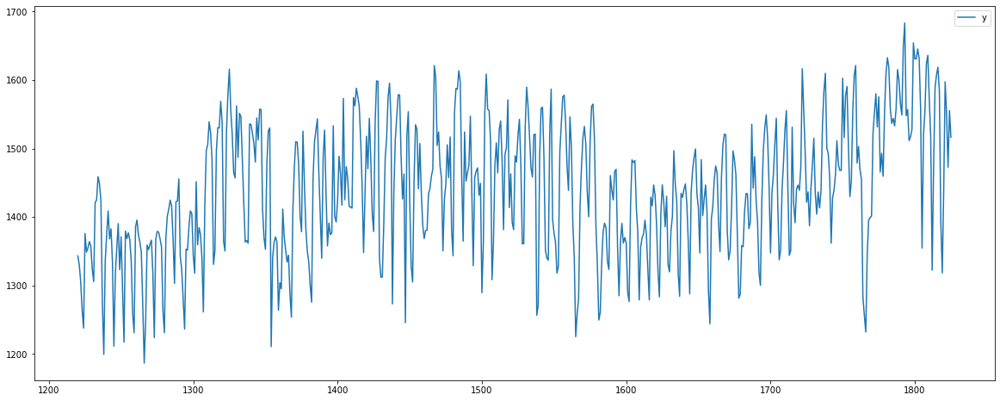

In [225]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h21.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:14 - cmdstanpy - INFO - Chain [1] start processing
22:34:14 - cmdstanpy - INFO - Chain [1] done processing


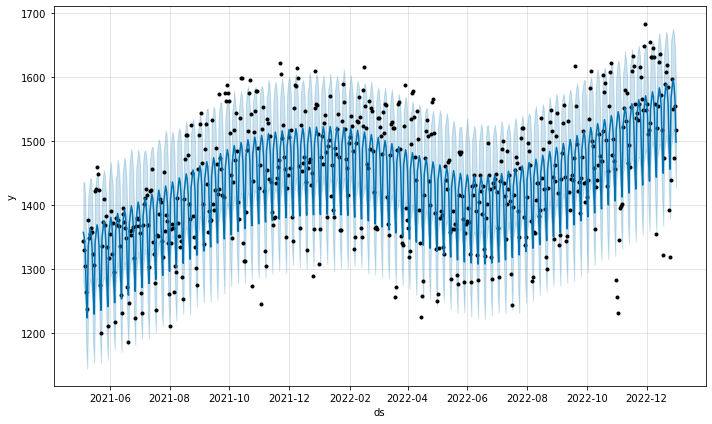

In [226]:
# Entrenamiento co el modelo PROPHET
model_prophet_h21 = Prophet()
model_prophet_h21.fit(entrenamient_h21)

forecast_h21 = model_prophet_h21.predict()
fig_h21 = model_prophet_h21.plot(forecast_h21)

In [227]:
# Predicción 10 dias 
future_data_h21 = model_prophet_h21.make_future_dataframe(periods=10)
prueba_h21 = model_prophet_h21.predict(future_data_h21)

test_prueba_h21 = prueba_h21['yhat']
# mostrar resultados
test_prueba_h21.tail(12)

604    1563.062738
605    1498.077421
606    1462.021829
607    1573.886709
608    1588.609682
609    1601.550027
610    1593.601672
611    1569.265879
612    1504.280562
613    1468.224970
614    1580.089850
615    1594.812823
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 22:00

In [228]:
# se elige las columas a utilizar 
datah22=data[['FECHA','H22']]
datah22.head()

,FECHA,H22
0,2018-06-19,1238.816
1,2018-06-20,1194.540
2,2018-06-21,1159.118
3,2018-06-22,1199.910
4,2018-06-23,1169.120


In [229]:
# Cambiamos el Nombre de las Columnas
entrh22 = datah22.copy()
entrh22.columns = ['ds','y']
entrenamient_h22 = entrh22[1220:]
entrenamient_h22.head()

,ds,y
1220,2021-05-05,1224.36
1221,2021-05-06,1222.21
1222,2021-05-07,1211.43
1223,2021-05-08,1177.62
1224,2021-05-09,1138.00


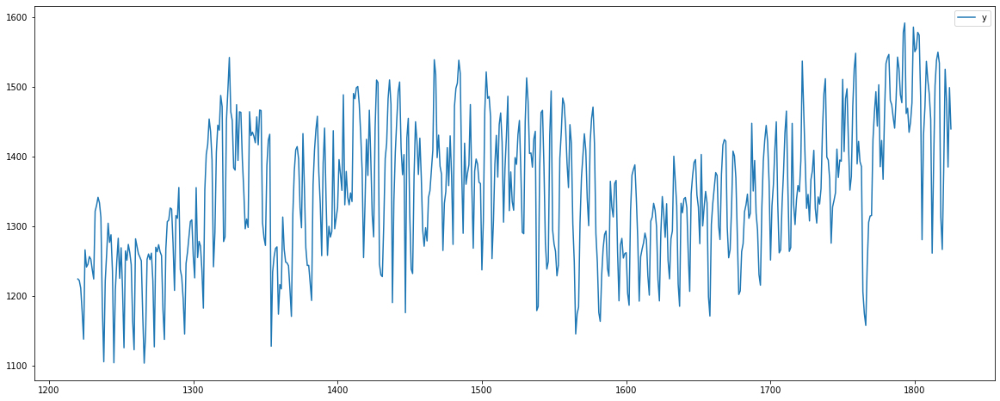

In [230]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h22.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:16 - cmdstanpy - INFO - Chain [1] start processing
22:34:16 - cmdstanpy - INFO - Chain [1] done processing


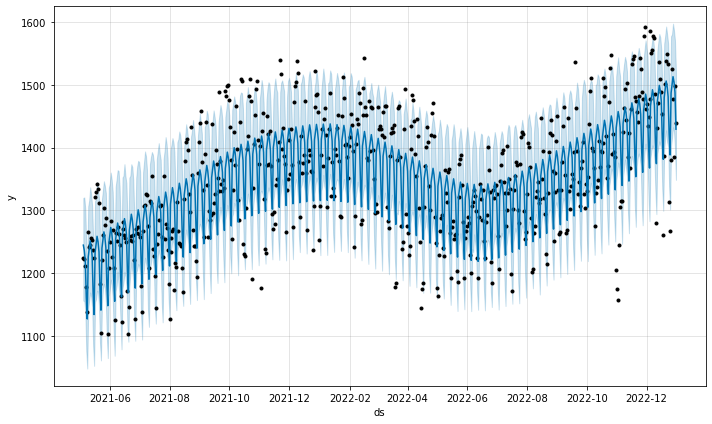

In [231]:
# Entrenamiento co el modelo PROPHET
model_prophet_h22 = Prophet()
model_prophet_h22.fit(entrenamient_h22)

forecast_h22 = model_prophet_h22.predict()
fig_h22 = model_prophet_h22.plot(forecast_h22)

In [232]:
# Predicción 10 dias 
future_data_h22 = model_prophet_h22.make_future_dataframe(periods=10)
prueba_h22 = model_prophet_h22.predict(future_data_h22)

test_prueba_h22 = prueba_h22['yhat']
# mostrar resultados
test_prueba_h22.tail(12)

604    1487.990949
605    1429.289875
606    1395.292223
607    1493.793658
608    1506.645890
609    1519.817617
610    1511.270988
611    1494.930171
612    1436.229097
613    1402.231445
614    1500.732880
615    1513.585112
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 23:00

In [233]:
# se elige las columas a utilizar 
datah23=data[['FECHA','H23']]
datah23.head()

,FECHA,H23
0,2018-06-19,1083.550
1,2018-06-20,1062.910
2,2018-06-21,1029.254
3,2018-06-22,1074.630
4,2018-06-23,1065.740


In [234]:
# Cambiamos el Nombre de las Columnas
entrh23 = datah23.copy()
entrh23.columns = ['ds','y']
entrenamient_h23 = entrh23[1220:]
entrenamient_h23.head()

,ds,y
1220,2021-05-05,1089.22
1221,2021-05-06,1077.37
1222,2021-05-07,1090.68
1223,2021-05-08,1053.36
1224,2021-05-09,1007.44


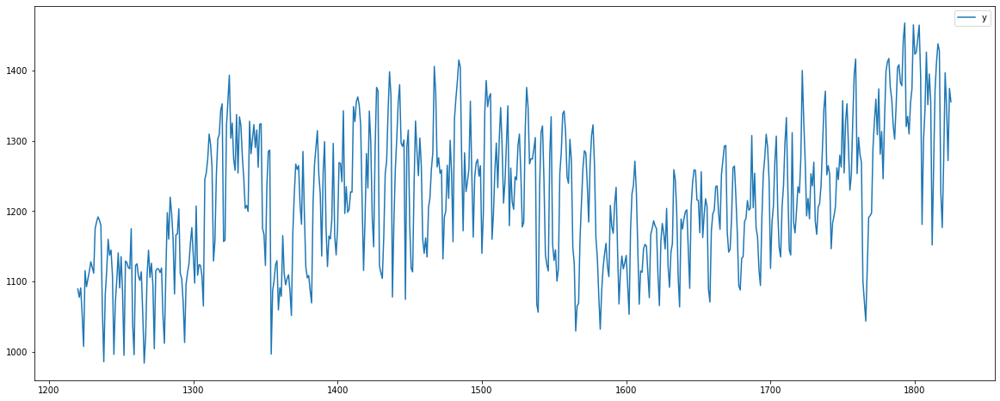

In [235]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h23.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:18 - cmdstanpy - INFO - Chain [1] start processing
22:34:18 - cmdstanpy - INFO - Chain [1] done processing


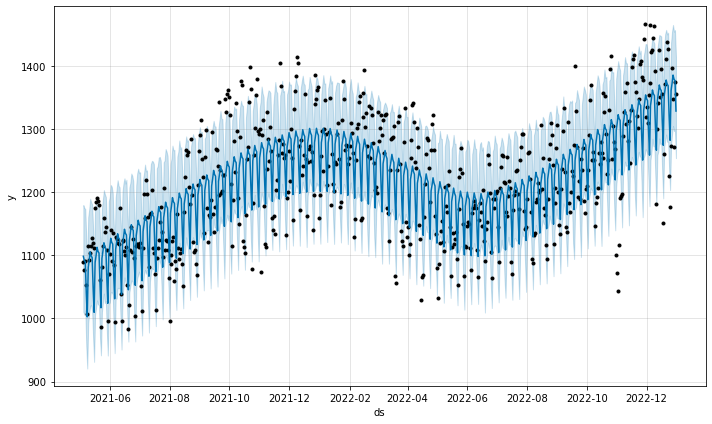

In [236]:
# Entrenamiento co el modelo PROPHET
model_prophet_h23 = Prophet()
model_prophet_h23.fit(entrenamient_h23)

forecast_h23 = model_prophet_h23.predict()
fig_h23 = model_prophet_h23.plot(forecast_h23)

In [237]:
# Predicción 10 dias 
future_data_h23 = model_prophet_h23.make_future_dataframe(periods=10)
prueba_h23 = model_prophet_h23.predict(future_data_h23)

test_prueba_h23 = prueba_h23['yhat']
# mostrar resultados
test_prueba_h23.tail(12)

604    1376.969384
605    1328.810229
606    1290.344830
607    1368.836080
608    1380.284447
609    1393.722369
610    1387.246916
611    1384.820702
612    1336.661547
613    1298.196149
614    1376.687399
615    1388.135765
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

## Hora 24:00

In [238]:
# se elige las columas a utilizar 
datah24=data[['FECHA','H24']]
datah24.head()

,FECHA,H24
0,2018-06-19,950.075
1,2018-06-20,943.710
2,2018-06-21,900.123
3,2018-06-22,952.990
4,2018-06-23,964.970


In [239]:
# Cambiamos el Nombre de las Columnas
entrh24 = datah24.copy()
entrh24.columns = ['ds','y']
entrenamient_h24 = entrh24[1220:]
entrenamient_h24.head()

,ds,y
1220,2021-05-05,978.52
1221,2021-05-06,976.30
1222,2021-05-07,983.32
1223,2021-05-08,950.74
1224,2021-05-09,910.87


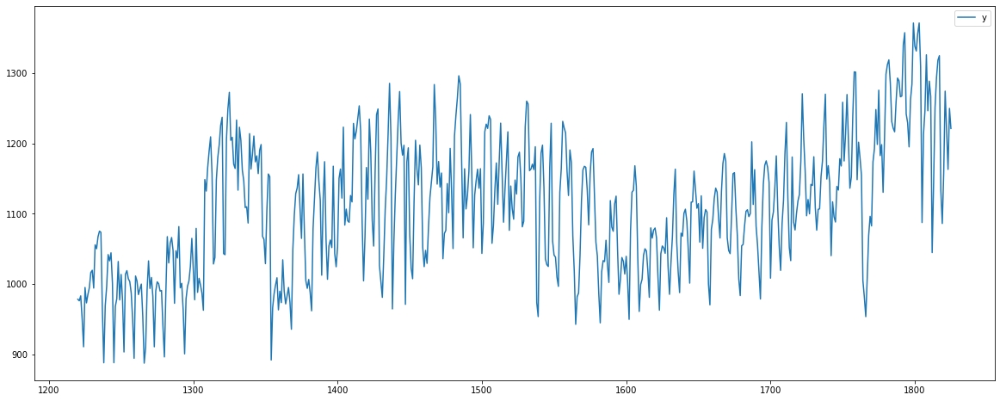

In [240]:
# Graficamos los datos
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8))
entrenamient_h24.plot.line(y='y', ax = axes, rot=0)
plt.show()

22:34:20 - cmdstanpy - INFO - Chain [1] start processing
22:34:20 - cmdstanpy - INFO - Chain [1] done processing


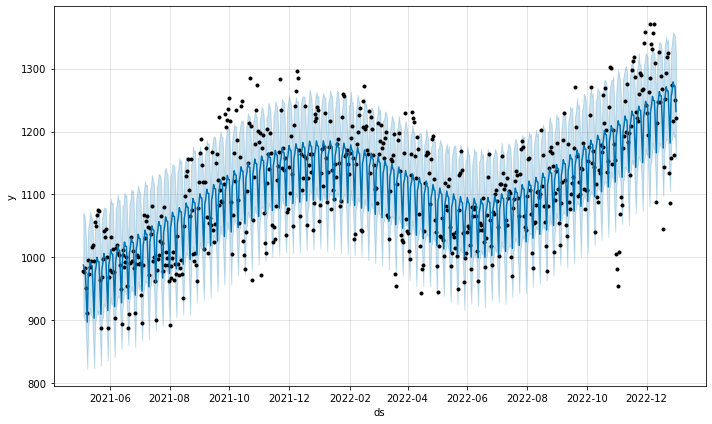

In [241]:
# Entrenamiento co el modelo PROPHET
model_prophet_h24 = Prophet()
model_prophet_h24.fit(entrenamient_h24)

forecast_h24 = model_prophet_h24.predict()
fig_h24 = model_prophet_h24.plot(forecast_h24)

In [242]:
# Predicción 10 dias 
future_data_h24 = model_prophet_h24.make_future_dataframe(periods=10)
prueba_h24 = model_prophet_h24.predict(future_data_h24)

test_prueba_h24 = prueba_h24['yhat']
# mostrar resultados
test_prueba_h24.tail(12)

604    1272.228228
605    1231.958337
606    1189.220364
607    1261.842062
608    1271.492007
609    1286.570575
610    1280.235380
611    1279.946833
612    1239.676943
613    1196.938969
614    1269.560668
615    1279.210613
Name: yhat, dtype: float64

- Resultado 606 correspode a la fecha Domingo, 01 de enero de 2023
- Resultado 607 correspode a la fecha Lunes, 02 de enero de 2023
....
- resultado 612 correspode a la fecha Sabado, 07 de enero de 2023

# Seleccion del dia especifico para las Predicciones 

In [243]:
# columna dia index
dataset_1 = dataset.set_index('DIA')

In [244]:
# elegir solo los dias del dataset
dataset_d = dataset_1.loc['Domingo']
# modificar dependiendo el dia que quiere predecir 
dataset_d.head()

,FECHA,H1,H2,H3,H4,H5,H6,H7,H8,H9,...,H17,H18,H19,H20,H21,H22,H23,H24,TOTAL,DEMANDA_MAXIMA
DIA,,,,,,,,,,,,,,,,,,,,,
Domingo,2018-02-18,878.62,821.30,791.43,771.22,761.83,771.08,714.672,780.816,846.552,...,943.350,952.332,1064.35,1256.51,1266.33,1197.61,1063.91,919.36,22195.191,1271.06
Domingo,2018-02-25,916.05,861.62,822.60,802.59,788.44,783.09,723.982,788.062,853.448,...,986.388,988.708,1154.36,1316.65,1313.01,1249.04,1116.85,976.58,22966.714,1319.02
Domingo,2018-03-04,930.28,865.99,836.59,805.21,801.54,795.48,744.130,809.500,882.288,...,1010.304,1009.634,1203.40,1320.55,1321.54,1232.09,1121.65,983.01,23421.275,1325.15
Domingo,2018-03-11,904.52,847.10,813.17,794.24,791.87,804.96,729.592,803.454,860.890,...,964.000,965.648,1200.21,1309.51,1301.56,1229.83,1088.57,958.92,22821.269,1313.87
Domingo,2018-03-18,887.98,842.51,812.08,793.81,788.12,799.01,736.188,795.650,852.148,...,958.058,985.698,1233.73,1301.14,1283.40,1205.57,1072.97,946.92,22677.717,1302.49


In [245]:
# enumeramos la nueva tabla
dataset_d['numeros']= np.arange(len(dataset_d))

In [246]:
dataset_Ad = dataset_d.set_index('numeros')
dataset_Ad.head()

,FECHA,H1,H2,H3,H4,H5,H6,H7,H8,H9,...,H17,H18,H19,H20,H21,H22,H23,H24,TOTAL,DEMANDA_MAXIMA
numeros,,,,,,,,,,,,,,,,,,,,,
0,2018-02-18,878.62,821.30,791.43,771.22,761.83,771.08,714.672,780.816,846.552,...,943.350,952.332,1064.35,1256.51,1266.33,1197.61,1063.91,919.36,22195.191,1271.06
1,2018-02-25,916.05,861.62,822.60,802.59,788.44,783.09,723.982,788.062,853.448,...,986.388,988.708,1154.36,1316.65,1313.01,1249.04,1116.85,976.58,22966.714,1319.02
2,2018-03-04,930.28,865.99,836.59,805.21,801.54,795.48,744.130,809.500,882.288,...,1010.304,1009.634,1203.40,1320.55,1321.54,1232.09,1121.65,983.01,23421.275,1325.15
3,2018-03-11,904.52,847.10,813.17,794.24,791.87,804.96,729.592,803.454,860.890,...,964.000,965.648,1200.21,1309.51,1301.56,1229.83,1088.57,958.92,22821.269,1313.87
4,2018-03-18,887.98,842.51,812.08,793.81,788.12,799.01,736.188,795.650,852.148,...,958.058,985.698,1233.73,1301.14,1283.40,1205.57,1072.97,946.92,22677.717,1302.49


# Prediccio con el modelo ARIMA (Utilizando dias especificos)

## Hora  1:00

In [247]:
# elegimos las columnas a utilizar
dataset_Ah1=dataset_Ad[['FECHA','H1']]
dataset_Ah1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H1      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [248]:
# prueba con arima
dataset_Arima_h1 = ARIMA(dataset_Ah1['H1'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h1 = dataset_Arima_h1.fit()

In [249]:
start_dh1 = len(dataset_Ah1)
end_dh1 = len(dataset_Ah1)+10

PrediccionA_dh1 = dataset_EntrA_h1.predict(start=start_dh1, end=end_dh1, )
PrediccionA_dh1.tail(11)

260    1068.535825
261    1062.484207
262    1007.642444
263    1064.601240
264    1036.100276
265    1037.419809
266    1034.575620
267     981.521845
268    1036.909596
269    1020.707342
270    1036.682597
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 2:00

In [250]:
# elegimos las columnas a utilizar
dataset_Ah2=dataset_Ad[['FECHA','H2']]
dataset_Ah2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H2      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [251]:
# prueba con arima
dataset_Arima_h2 = ARIMA(dataset_Ah2['H2'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h2 = dataset_Arima_h2.fit()

In [252]:
start_dh2 = len(dataset_Ah2)
end_dh2 = len(dataset_Ah2)+10

PrediccionA_dh2 = dataset_EntrA_h2.predict(start=start_dh2, end=end_dh2, )
PrediccionA_dh2.tail(11)

260     964.199619
261    1008.362265
262     934.632709
263    1007.395474
264     998.473872
265     950.927204
266     988.760750
267     911.762358
268     978.792749
269     968.972123
270     970.661353
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 3:00

In [253]:
# elegimos las columnas a utilizar
dataset_Ah3=dataset_Ad[['FECHA','H3']]
dataset_Ah3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H3      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [254]:
# prueba con arima
dataset_Arima_h3 = ARIMA(dataset_Ah3['H3'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h3 = dataset_Arima_h3.fit()

In [255]:
start_dh3 = len(dataset_Ah3)
end_dh3 = len(dataset_Ah3)+10

PrediccionA_dh3 = dataset_EntrA_h3.predict(start=start_dh3, end=end_dh3, )
PrediccionA_dh3.tail(11)

260    958.782948
261    969.143376
262    921.228530
263    945.228652
264    951.924925
265    919.812324
266    950.612627
267    910.903425
268    926.479136
269    933.585486
270    925.955588
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 4:00

In [256]:
# elegimos las columnas a utilizar
dataset_Ah4=dataset_Ad[['FECHA','H4']]
dataset_Ah4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H4      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [257]:
# prueba con arima
dataset_Arima_h4 = ARIMA(dataset_Ah4['H4'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h4 = dataset_Arima_h4.fit()

In [258]:
start_dh4 = len(dataset_Ah4)
end_dh4 = len(dataset_Ah4)+10

PrediccionA_dh4 = dataset_EntrA_h4.predict(start=start_dh4, end=end_dh4, )
PrediccionA_dh4.tail(11)

260    958.447843
261    946.707704
262    887.294815
263    913.559672
264    929.705811
265    911.359065
266    925.959622
267    899.497392
268    883.900263
269    915.094586
270    927.830764
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 5:00

In [259]:
# elegimos las columnas a utilizar
dataset_Ah5=dataset_Ad[['FECHA','H5']]
dataset_Ah5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H5      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [260]:
# prueba con arima
dataset_Arima_h5 = ARIMA(dataset_Ah5['H5'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h5 = dataset_Arima_h5.fit()

In [261]:
start_dh5 = len(dataset_Ah5)
end_dh5 = len(dataset_Ah5)+10

PrediccionA_dh5 = dataset_EntrA_h5.predict(start=start_dh5, end=end_dh5, )
PrediccionA_dh5.tail(11)

260    925.605593
261    899.670701
262    877.622630
263    904.583632
264    921.789698
265    893.897254
266    895.136594
267    887.774452
268    879.062844
269    906.788421
270    916.354342
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 6:00

In [262]:
# elegimos las columnas a utilizar
dataset_Ah6=dataset_Ad[['FECHA','H6']]
dataset_Ah6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H6      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [263]:
# prueba con arima
dataset_Arima_h6 = ARIMA(dataset_Ah6['H6'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h6 = dataset_Arima_h6.fit()

In [264]:
start_dh6 = len(dataset_Ah6)
end_dh6 = len(dataset_Ah6)+10

PrediccionA_dh6 = dataset_EntrA_h6.predict(start=start_dh6, end=end_dh6, )
PrediccionA_dh6.tail(11)

260    869.092433
261    849.384674
262    850.954095
263    867.306666
264    846.028190
265    870.558729
266    857.863747
267    860.498367
268    874.525272
269    855.476553
270    878.069461
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 7:00

In [265]:
# elegimos las columnas a utilizar
dataset_Ah7=dataset_Ad[['FECHA','H7']]
dataset_Ah7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H7      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [266]:
# prueba con arima
dataset_Arima_h7 = ARIMA(dataset_Ah7['H7'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h7 = dataset_Arima_h7.fit()

In [267]:
start_dh7 = len(dataset_Ah7)
end_dh7 = len(dataset_Ah7)+10

PrediccionA_dh7 = dataset_EntrA_h7.predict(start=start_dh7, end=end_dh7, )
PrediccionA_dh7.tail(11)

260    813.103792
261    824.628977
262    848.936423
263    820.540311
264    844.138550
265    824.456479
266    794.662954
267    842.173977
268    826.749292
269    812.325965
270    842.707011
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 8:00

In [268]:
# elegimos las columnas a utilizar
dataset_Ah8=dataset_Ad[['FECHA','H8']]
dataset_Ah8.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H8      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [269]:
# prueba con arima
dataset_Arima_h8 = ARIMA(dataset_Ah8['H8'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h8 = dataset_Arima_h8.fit()

In [270]:
start_dh8 = len(dataset_Ah8)
end_dh8 = len(dataset_Ah8)+10

PrediccionA_dh8 = dataset_EntrA_h8.predict(start=start_dh8, end=end_dh8, )
PrediccionA_dh8.tail(11)

260    885.480365
261    907.433009
262    912.269923
263    890.777000
264    866.552151
265    872.630031
266    871.411517
267    912.085025
268    894.964849
269    874.999690
270    868.013424
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 9:00

In [271]:
# elegimos las columnas a utilizar
dataset_Ah9=dataset_Ad[['FECHA','H9']]
dataset_Ah9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H9      260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [272]:
# prueba con arima
dataset_Arima_h9 = ARIMA(dataset_Ah9['H9'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h9 = dataset_Arima_h9.fit()

In [273]:
start_dh9 = len(dataset_Ah9)
end_dh9 = len(dataset_Ah9)+10

PrediccionA_dh9 = dataset_EntrA_h9.predict(start=start_dh9, end=end_dh9, )
PrediccionA_dh9.tail(11)

260    932.967216
261    963.801012
262    995.698105
263    970.527498
264    933.196783
265    919.030859
266    933.491814
267    973.485733
268    974.441585
269    942.549234
270    922.907817
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 10:00

In [274]:
# elegimos las columnas a utilizar
dataset_Ah10=dataset_Ad[['FECHA','H10']]
dataset_Ah10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H10     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [275]:
# prueba con arima
dataset_Arima_h10 = ARIMA(dataset_Ah10['H10'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h10 = dataset_Arima_h10.fit()

In [276]:
start_dh10 = len(dataset_Ah10)
end_dh10 = len(dataset_Ah10)+10

PrediccionA_dh10 = dataset_EntrA_h10.predict(start=start_dh10, end=end_dh10, )
PrediccionA_dh10.tail(11)

260     957.034072
261    1007.289502
262    1034.700522
263    1027.005733
264     971.662603
265     958.965552
266     966.909273
267    1028.639326
268    1014.459392
269     990.954472
270     949.232717
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 11:00

In [277]:
# elegimos las columnas a utilizar
dataset_Ah11=dataset_Ad[['FECHA','H11']]
dataset_Ah11.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H11     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [278]:
# prueba con arima
dataset_Arima_h11 = ARIMA(dataset_Ah11['H11'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h11 = dataset_Arima_h11.fit()

In [279]:
start_dh11 = len(dataset_Ah11)
end_dh11 = len(dataset_Ah11)+10

PrediccionA_dh11 = dataset_EntrA_h11.predict(start=start_dh11, end=end_dh11, )
PrediccionA_dh11.tail(11)

260     992.717839
261    1037.700951
262    1073.929230
263    1071.224132
264    1018.609893
265     995.957259
266    1000.463769
267    1056.717316
268    1061.312433
269    1038.391834
270     987.665214
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 12:00

In [280]:
# elegimos las columnas a utilizar
dataset_Ah12=dataset_Ad[['FECHA','H12']]
dataset_Ah12.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H12     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [281]:
# prueba con arima
dataset_Arima_h12 = ARIMA(dataset_Ah12['H12'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h12 = dataset_Arima_h12.fit()

In [282]:
start_dh12 = len(dataset_Ah12)
end_dh12 = len(dataset_Ah12)+10

PrediccionA_dh12 = dataset_EntrA_h12.predict(start=start_dh12, end=end_dh12, )
PrediccionA_dh12.tail(11)

260    1026.343321
261    1021.571283
262    1040.675698
263    1040.375902
264    1024.384116
265    1027.168042
266    1023.196596
267    1029.769983
268    1024.757131
269    1031.899621
270    1020.443530
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 13:00

In [283]:
# elegimos las columnas a utilizar
dataset_Ah13=dataset_Ad[['FECHA','H13']]
dataset_Ah13.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H13     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [284]:
# prueba con arima
dataset_Arima_h13 = ARIMA(dataset_Ah13['H13'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h13 = dataset_Arima_h13.fit()

In [285]:
start_dh13 = len(dataset_Ah13)
end_dh13 = len(dataset_Ah13)+10

PrediccionA_dh13 = dataset_EntrA_h13.predict(start=start_dh13, end=end_dh13, )
PrediccionA_dh13.tail(11)

260    1029.923142
261    1017.528351
262    1030.184345
263    1027.230062
264    1047.516928
265    1009.532066
266    1013.637413
267    1026.062303
268    1035.596805
269    1011.768958
270    1017.604609
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 14:00

In [286]:
# elegimos las columnas a utilizar
dataset_Ah14=dataset_Ad[['FECHA','H14']]
dataset_Ah14.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H14     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [287]:
# prueba con arima
dataset_Arima_h14 = ARIMA(dataset_Ah14['H14'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h14 = dataset_Arima_h14.fit()

In [288]:
start_dh14 = len(dataset_Ah14)
end_dh14 = len(dataset_Ah14)+10

PrediccionA_dh14 = dataset_EntrA_h14.predict(start=start_dh14, end=end_dh14, )
PrediccionA_dh14.tail(11)

260    1013.588347
261    1054.718216
262    1039.953564
263    1009.725623
264    1057.276454
265    1036.395349
266    1022.272865
267    1031.282184
268    1049.493434
269    1019.457958
270    1027.306436
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 15:00

In [289]:
# elegimos las columnas a utilizar
dataset_Ah15=dataset_Ad[['FECHA','H15']]
dataset_Ah15.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H15     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [290]:
# prueba con arima
dataset_Arima_h15 = ARIMA(dataset_Ah15['H15'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h15 = dataset_Arima_h15.fit()

In [291]:
start_dh15 = len(dataset_Ah15)
end_dh15 = len(dataset_Ah15)+10

PrediccionA_dh15 = dataset_EntrA_h15.predict(start=start_dh15, end=end_dh15, )
PrediccionA_dh15.tail(11)

260    1058.481164
261    1058.470430
262    1046.306690
263    1053.749081
264    1061.331257
265    1047.202717
266    1052.213392
267    1039.434914
268    1059.617092
269    1049.404109
270    1047.216016
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 16:00

In [292]:
# elegimos las columnas a utilizar
dataset_Ah16=dataset_Ad[['FECHA','H16']]
dataset_Ah16.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H16     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [293]:
# prueba con arima
dataset_Arima_h16 = ARIMA(dataset_Ah16['H16'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h16 = dataset_Arima_h16.fit()

In [294]:
start_dh16 = len(dataset_Ah16)
end_dh16 = len(dataset_Ah16)+10

PrediccionA_dh16 = dataset_EntrA_h16.predict(start=start_dh16, end=end_dh16, )
PrediccionA_dh16.tail(11)

260    1023.162174
261    1044.433898
262    1047.744636
263    1067.811758
264    1063.747314
265    1031.584447
266    1044.980787
267    1031.988812
268    1071.505606
269    1060.967005
270    1047.996466
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 17:00

In [295]:
# elegimos las columnas a utilizar
dataset_Ah17=dataset_Ad[['FECHA','H17']]
dataset_Ah17.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H17     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [296]:
# prueba con arima
dataset_Arima_h17 = ARIMA(dataset_Ah17['H17'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h17 = dataset_Arima_h17.fit()

In [297]:
start_dh17 = len(dataset_Ah17)
end_dh17 = len(dataset_Ah17)+10

PrediccionA_dh17 = dataset_EntrA_h17.predict(start=start_dh17, end=end_dh17, )
PrediccionA_dh17.tail(11)

260    1028.428000
261    1053.986565
262    1054.475267
263    1087.500542
264    1062.962922
265    1048.557062
266    1042.751545
267    1046.496332
268    1078.059958
269    1067.070918
270    1057.518219
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 18:00

In [298]:
# elegimos las columnas a utilizar
dataset_Ah18=dataset_Ad[['FECHA','H18']]
dataset_Ah18.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H18     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [299]:
# prueba con arima
dataset_Arima_h18 = ARIMA(dataset_Ah18['H18'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h18 = dataset_Arima_h18.fit()

In [300]:
start_dh18 = len(dataset_Ah18)
end_dh18 = len(dataset_Ah18)+10

PrediccionA_dh18 = dataset_EntrA_h18.predict(start=start_dh18, end=end_dh18, )
PrediccionA_dh18.tail(11)

260    1065.046435
261    1074.324970
262    1085.539437
263    1087.757361
264    1093.460836
265    1084.660840
266    1117.976267
267    1091.334411
268    1109.058581
269    1109.410589
270    1102.627946
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 19:00

In [301]:
# elegimos las columnas a utilizar
dataset_Ah19=dataset_Ad[['FECHA','H19']]
dataset_Ah19.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H19     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [302]:
# prueba con arima
dataset_Arima_h19 = ARIMA(dataset_Ah19['H19'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h19 = dataset_Arima_h19.fit()

In [303]:
start_dh19 = len(dataset_Ah19)
end_dh19 = len(dataset_Ah19)+10

PrediccionA_dh19 = dataset_EntrA_h19.predict(start=start_dh19, end=end_dh19, )
PrediccionA_dh19.tail(11)

260    1155.162917
261    1168.393598
262    1163.549596
263    1175.214463
264    1189.148644
265    1224.294134
266    1231.151944
267    1241.974959
268    1249.572826
269    1252.615667
270    1257.288714
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 20:00

In [304]:
# elegimos las columnas a utilizar
dataset_Ah20=dataset_Ad[['FECHA','H20']]
dataset_Ah20.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H20     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [305]:
# prueba con arima
dataset_Arima_h20 = ARIMA(dataset_Ah20['H20'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h20 = dataset_Arima_h20.fit()

In [306]:
start_dh20 = len(dataset_Ah20)
end_dh20 = len(dataset_Ah20)+10

PrediccionA_dh20 = dataset_EntrA_h20.predict(start=start_dh20, end=end_dh20, )
PrediccionA_dh20.tail(11)

260    1324.953892
261    1315.625518
262    1336.724408
263    1346.714905
264    1339.826056
265    1355.718707
266    1328.400182
267    1336.493252
268    1345.261414
269    1342.514599
270    1343.141628
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 21:00

In [307]:
# elegimos las columnas a utilizar
dataset_Ah21=dataset_Ad[['FECHA','H21']]
dataset_Ah21.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H21     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [308]:
# prueba con arima
dataset_Arima_h21 = ARIMA(dataset_Ah21['H21'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h21 = dataset_Arima_h21.fit()

In [309]:
start_dh21 = len(dataset_Ah21)
end_dh21 = len(dataset_Ah21)+10

PrediccionA_dh21 = dataset_EntrA_h21.predict(start=start_dh21, end=end_dh21, )
PrediccionA_dh21.tail(11)

260    1300.975432
261    1313.380436
262    1311.127630
263    1302.978799
264    1320.620068
265    1322.212686
266    1303.666854
267    1316.638633
268    1314.683324
269    1301.435485
270    1314.773998
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 22:00

In [310]:
# elegimos las columnas a utilizar
dataset_Ah22=dataset_Ad[['FECHA','H22']]
dataset_Ah22.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H22     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [311]:
# prueba con arima
dataset_Arima_h22 = ARIMA(dataset_Ah22['H22'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h22 = dataset_Arima_h22.fit()

In [312]:
start_dh22 = len(dataset_Ah22)
end_dh22 = len(dataset_Ah22)+10

PrediccionA_dh22 = dataset_EntrA_h22.predict(start=start_dh22, end=end_dh22, )
PrediccionA_dh22.tail(11)

260    1206.976582
261    1264.071874
262    1235.522202
263    1278.301405
264    1255.885326
265    1227.459664
266    1237.093647
267    1231.343310
268    1259.442401
269    1260.196562
270    1235.116365
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 23:00

In [313]:
# elegimos las columnas a utilizar
dataset_Ah23=dataset_Ad[['FECHA','H23']]
dataset_Ah23.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H23     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [314]:
# prueba con arima
dataset_Arima_h23 = ARIMA(dataset_Ah23['H23'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h23 = dataset_Arima_h23.fit()

In [315]:
start_dh23 = len(dataset_Ah23)
end_dh23 = len(dataset_Ah23)+10

PrediccionA_dh23 = dataset_EntrA_h23.predict(start=start_dh23, end=end_dh23, )
PrediccionA_dh23.tail(11)

260    1096.062884
261    1138.046101
262    1117.693074
263    1160.884722
264    1148.047602
265    1117.507312
266    1115.998397
267    1100.845963
268    1138.630850
269    1141.982211
270    1126.260112
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora 24:00

In [316]:
# elegimos las columnas a utilizar
dataset_Ah24=dataset_Ad[['FECHA','H24']]
dataset_Ah24.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260 entries, 0 to 259
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   260 non-null    datetime64[ns]
 1   H24     260 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.1 KB


In [317]:
# prueba con arima
dataset_Arima_h24 = ARIMA(dataset_Ah24['H24'],
              order=(6,0,10),
              #seasonal_order=(1, 0, 1, 12)
            )

# Fit the model
dataset_EntrA_h24 = dataset_Arima_h24.fit()

In [318]:
start_dh24 = len(dataset_Ah24)
end_dh24 = len(dataset_Ah24)+10

PrediccionA_dh24 = dataset_EntrA_h24.predict(start=start_dh24, end=end_dh24, )
PrediccionA_dh24.tail(11)

260     989.783162
261    1048.721529
262    1022.507810
263    1060.611492
264    1051.313777
265    1000.703188
266    1019.378328
267     992.957769
268    1040.310370
269    1046.788934
270    1008.052526
Name: predicted_mean, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

# Prediccio con el modelo PROPHET (Utilizando dias especificos)

## Hora  1:00

In [319]:
# elegimos columas a utilizar
Prophet_Dh1=dataset_Ad[['FECHA','H1']]
Prophet_Dh1.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh1 = Prophet_Dh1.copy()
Prophet_PDh1.columns = ['ds','y']
Prophet_P_Dh1 = Prophet_PDh1

In [320]:
# entrennamiento del modelo
model_prophet_Dh1 = Prophet()
model_prophet_Dh1.fit(Prophet_P_Dh1)

forecast_PDh1 = model_prophet_Dh1.predict()

22:35:52 - cmdstanpy - INFO - Chain [1] start processing
22:35:52 - cmdstanpy - INFO - Chain [1] done processing


In [321]:
# resultados de prediccion 
future_data_Dh1 = model_prophet_Dh1.make_future_dataframe(periods=3)
pruebah1 = model_prophet_Dh1.predict(future_data_Dh1)
test_pruebah1 = pruebah1['yhat']
test_pruebah1.tail(3)

260    1074.229469
261    1070.371510
262    1066.812353
Name: yhat, dtype: float64

- Observamos la catidad de datos que tenemos para entrennamieto
- El resultado siguiente representa la prediccion para la hora mencionada

## Hora  2:00

In [323]:
# elegimos columas a utilizar
Prophet_Dh2=dataset_Ad[['FECHA','H2']]
Prophet_Dh2.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh2 = Prophet_Dh2.copy()
Prophet_PDh2.columns = ['ds','y']
Prophet_P_Dh2 = Prophet_PDh2

In [324]:
# entrennamiento del modelo
model_prophet_Dh2 = Prophet()
model_prophet_Dh2.fit(Prophet_P_Dh2)

forecast_PDh2 = model_prophet_Dh2.predict()

22:36:24 - cmdstanpy - INFO - Chain [1] start processing
22:36:24 - cmdstanpy - INFO - Chain [1] done processing


In [325]:
# resultados de prediccion 
future_data_Dh2 = model_prophet_Dh2.make_future_dataframe(periods=3)
pruebah2 = model_prophet_Dh2.predict(future_data_Dh2)
test_pruebah2 = pruebah2['yhat']
test_pruebah2.tail(3)

260    1018.523656
261    1014.915758
262    1011.595568
Name: yhat, dtype: float64

## Hora  3:00

In [326]:
# elegimos columas a utilizar
Prophet_Dh3=dataset_Ad[['FECHA','H3']]
Prophet_Dh3.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh3 = Prophet_Dh1.copy()
Prophet_PDh3.columns = ['ds','y']
Prophet_P_Dh3 = Prophet_PDh3

In [327]:
# entrennamiento del modelo
model_prophet_Dh3 = Prophet()
model_prophet_Dh3.fit(Prophet_P_Dh3)

forecast_PDh3 = model_prophet_Dh3.predict()

22:36:26 - cmdstanpy - INFO - Chain [1] start processing
22:36:26 - cmdstanpy - INFO - Chain [1] done processing


In [328]:
# resultados de prediccion 
future_data_Dh3 = model_prophet_Dh3.make_future_dataframe(periods=3)
pruebah3 = model_prophet_Dh3.predict(future_data_Dh3)
test_pruebah3 = pruebah3['yhat']
test_pruebah3.tail(3)

260    1074.229469
261    1070.371510
262    1066.812353
Name: yhat, dtype: float64

## Hora  4:00

In [329]:
# elegimos columas a utilizar
Prophet_Dh4=dataset_Ad[['FECHA','H4']]
Prophet_Dh4.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh4 = Prophet_Dh4.copy()
Prophet_PDh4.columns = ['ds','y']
Prophet_P_Dh4 = Prophet_PDh4

In [330]:
# entrennamiento del modelo
model_prophet_Dh4 = Prophet()
model_prophet_Dh4.fit(Prophet_P_Dh4)

forecast_PDh4 = model_prophet_Dh4.predict()

22:36:27 - cmdstanpy - INFO - Chain [1] start processing
22:36:27 - cmdstanpy - INFO - Chain [1] done processing


In [331]:
# resultados de prediccion 
future_data_Dh4 = model_prophet_Dh4.make_future_dataframe(periods=3)
pruebah4 = model_prophet_Dh4.predict(future_data_Dh4)
test_pruebah4 = pruebah4['yhat']
test_pruebah4.tail(3)

260    952.379697
261    949.144853
262    946.151354
Name: yhat, dtype: float64

## Hora  5:00

In [332]:
# elegimos columas a utilizar
Prophet_Dh5=dataset_Ad[['FECHA','H5']]
Prophet_Dh5.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh5 = Prophet_Dh5.copy()
Prophet_PDh5.columns = ['ds','y']
Prophet_P_Dh5 = Prophet_PDh5

In [333]:
# entrennamiento del modelo
model_prophet_Dh5 = Prophet()
model_prophet_Dh5.fit(Prophet_P_Dh5)

forecast_PDh5 = model_prophet_Dh5.predict()

22:36:28 - cmdstanpy - INFO - Chain [1] start processing
22:36:28 - cmdstanpy - INFO - Chain [1] done processing


In [334]:
# resultados de prediccion 
future_data_Dh5 = model_prophet_Dh5.make_future_dataframe(periods=3)
pruebah5 = model_prophet_Dh5.predict(future_data_Dh5)
test_pruebah5 = pruebah5['yhat']
test_pruebah5.tail(3)

260    939.963370
261    936.765440
262    933.844335
Name: yhat, dtype: float64

## Hora  6:00

In [335]:
# elegimos columas a utilizar
Prophet_Dh6=dataset_Ad[['FECHA','H6']]
Prophet_Dh6.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh6 = Prophet_Dh6.copy()
Prophet_PDh6.columns = ['ds','y']
Prophet_P_Dh6 = Prophet_PDh6

In [336]:
# entrennamiento del modelo
model_prophet_Dh6 = Prophet()
model_prophet_Dh6.fit(Prophet_P_Dh6)

forecast_PDh6 = model_prophet_Dh6.predict()

22:36:29 - cmdstanpy - INFO - Chain [1] start processing
22:36:30 - cmdstanpy - INFO - Chain [1] done processing


In [337]:
# resultados de prediccion 
future_data_Dh6 = model_prophet_Dh6.make_future_dataframe(periods=3)
pruebah6 = model_prophet_Dh6.predict(future_data_Dh6)
test_pruebah6 = pruebah6['yhat']
test_pruebah6.tail(3)

260    853.997129
261    851.153098
262    848.663242
Name: yhat, dtype: float64

## Hora  7:00

In [338]:
# elegimos columas a utilizar
Prophet_Dh7=dataset_Ad[['FECHA','H7']]
Prophet_Dh7.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh7 = Prophet_Dh7.copy()
Prophet_PDh7.columns = ['ds','y']
Prophet_P_Dh7 = Prophet_PDh7

In [339]:
# entrennamiento del modelo
model_prophet_Dh7 = Prophet()
model_prophet_Dh7.fit(Prophet_P_Dh7)

forecast_PDh7 = model_prophet_Dh7.predict()

22:36:30 - cmdstanpy - INFO - Chain [1] start processing
22:36:30 - cmdstanpy - INFO - Chain [1] done processing


In [340]:
# resultados de prediccion 
future_data_Dh7 = model_prophet_Dh7.make_future_dataframe(periods=3)
pruebah7 = model_prophet_Dh7.predict(future_data_Dh7)
test_pruebah7 = pruebah7['yhat']
test_pruebah7.tail(3)

260    838.984606
261    835.495249
262    832.293269
Name: yhat, dtype: float64

## Hora  8:00

In [341]:
# elegimos columas a utilizar
Prophet_Dh8=dataset_Ad[['FECHA','H8']]
Prophet_Dh8.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh8 = Prophet_Dh8.copy()
Prophet_PDh8.columns = ['ds','y']
Prophet_P_Dh8 = Prophet_PDh8

In [342]:
# entrennamiento del modelo
model_prophet_Dh8 = Prophet()
model_prophet_Dh8.fit(Prophet_P_Dh8)

forecast_PDh8 = model_prophet_Dh8.predict()

22:36:31 - cmdstanpy - INFO - Chain [1] start processing
22:36:31 - cmdstanpy - INFO - Chain [1] done processing


In [343]:
# resultados de prediccion 
future_data_Dh8 = model_prophet_Dh8.make_future_dataframe(periods=3)
pruebah8 = model_prophet_Dh8.predict(future_data_Dh8)
test_pruebah8 = pruebah8['yhat']
test_pruebah8.tail(3)

260    903.966111
261    900.727029
262    897.718794
Name: yhat, dtype: float64

## Hora  9:00

In [344]:
# elegimos columas a utilizar
Prophet_Dh9=dataset_Ad[['FECHA','H9']]
Prophet_Dh9.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh9 = Prophet_Dh9.copy()
Prophet_PDh9.columns = ['ds','y']
Prophet_P_Dh9 = Prophet_PDh9

In [345]:
# entrennamiento del modelo
model_prophet_Dh9 = Prophet()
model_prophet_Dh9.fit(Prophet_P_Dh9)

forecast_PDh9 = model_prophet_Dh9.predict()

22:36:34 - cmdstanpy - INFO - Chain [1] start processing
22:36:35 - cmdstanpy - INFO - Chain [1] done processing


In [346]:
# resultados de prediccion 
future_data_Dh9 = model_prophet_Dh9.make_future_dataframe(periods=3)
pruebah9 = model_prophet_Dh9.predict(future_data_Dh9)
test_pruebah9 = pruebah9['yhat']
test_pruebah9.tail(3)

260    975.402121
261    972.251693
262    969.251976
Name: yhat, dtype: float64

## Hora  10:00

In [347]:
# elegimos columas a utilizar
Prophet_Dh10=dataset_Ad[['FECHA','H10']]
Prophet_Dh10.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh10 = Prophet_Dh10.copy()
Prophet_PDh10.columns = ['ds','y']
Prophet_P_Dh10 = Prophet_PDh10

In [348]:
# entrennamiento del modelo
model_prophet_Dh10 = Prophet()
model_prophet_Dh10.fit(Prophet_P_Dh10)

forecast_PDh10 = model_prophet_Dh10.predict()

22:36:35 - cmdstanpy - INFO - Chain [1] start processing
22:36:35 - cmdstanpy - INFO - Chain [1] done processing


In [349]:
# resultados de prediccion 
future_data_Dh10 = model_prophet_Dh10.make_future_dataframe(periods=3)
pruebah10 = model_prophet_Dh10.predict(future_data_Dh10)
test_pruebah10 = pruebah10['yhat']
test_pruebah10.tail(3)

260    1024.239214
261    1021.517515
262    1018.933783
Name: yhat, dtype: float64

## Hora  11:00

In [350]:
# elegimos columas a utilizar
Prophet_Dh11=dataset_Ad[['FECHA','H11']]
Prophet_Dh11.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh11 = Prophet_Dh11.copy()
Prophet_PDh11.columns = ['ds','y']
Prophet_P_Dh11 = Prophet_PDh11

In [351]:
# entrennamiento del modelo
model_prophet_Dh11 = Prophet()
model_prophet_Dh11.fit(Prophet_P_Dh11)

forecast_PDh11 = model_prophet_Dh11.predict()

22:36:37 - cmdstanpy - INFO - Chain [1] start processing
22:36:37 - cmdstanpy - INFO - Chain [1] done processing


In [352]:
# resultados de prediccion 
future_data_Dh11 = model_prophet_Dh11.make_future_dataframe(periods=3)
pruebah11 = model_prophet_Dh11.predict(future_data_Dh11)
test_pruebah11 = pruebah11['yhat']
test_pruebah11.tail(3)

260    1057.600092
261    1055.396133
262    1053.316760
Name: yhat, dtype: float64

## Hora  12:00

In [353]:
# elegimos columas a utilizar
Prophet_Dh12=dataset_Ad[['FECHA','H12']]
Prophet_Dh12.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh12 = Prophet_Dh12.copy()
Prophet_PDh12.columns = ['ds','y']
Prophet_P_Dh12 = Prophet_PDh12

In [354]:
# entrennamiento del modelo
model_prophet_Dh12 = Prophet()
model_prophet_Dh12.fit(Prophet_P_Dh12)

forecast_PDh12 = model_prophet_Dh12.predict()

22:36:48 - cmdstanpy - INFO - Chain [1] start processing
22:36:48 - cmdstanpy - INFO - Chain [1] done processing


In [355]:
# resultados de prediccion 
future_data_Dh12 = model_prophet_Dh12.make_future_dataframe(periods=3)
pruebah12 = model_prophet_Dh12.predict(future_data_Dh12)
test_pruebah12 = pruebah12['yhat']
test_pruebah12.tail(3)

260    1081.933555
261    1080.609043
262    1079.398134
Name: yhat, dtype: float64

## Hora  13:00

In [356]:
# elegimos columas a utilizar
Prophet_Dh13=dataset_Ad[['FECHA','H13']]
Prophet_Dh13.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh13 = Prophet_Dh13.copy()
Prophet_PDh13.columns = ['ds','y']
Prophet_P_Dh13 = Prophet_PDh13

In [357]:
# entrennamiento del modelo
model_prophet_Dh13 = Prophet()
model_prophet_Dh13.fit(Prophet_P_Dh13)

forecast_PDh13 = model_prophet_Dh13.predict()

22:36:49 - cmdstanpy - INFO - Chain [1] start processing
22:36:49 - cmdstanpy - INFO - Chain [1] done processing


In [358]:
# resultados de prediccion 
future_data_Dh13 = model_prophet_Dh13.make_future_dataframe(periods=3)
pruebah13 = model_prophet_Dh13.predict(future_data_Dh13)
test_pruebah13 = pruebah13['yhat']
test_pruebah13.tail(3)

260    1081.656140
261    1080.478822
262    1079.293227
Name: yhat, dtype: float64

## Hora  14:00

In [359]:
# elegimos columas a utilizar
Prophet_Dh14=dataset_Ad[['FECHA','H14']]
Prophet_Dh14.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh14 = Prophet_Dh14.copy()
Prophet_PDh14.columns = ['ds','y']
Prophet_P_Dh14 = Prophet_PDh14

In [360]:
# entrennamiento del modelo
model_prophet_Dh14 = Prophet()
model_prophet_Dh14.fit(Prophet_P_Dh14)

forecast_PDh14 = model_prophet_Dh14.predict()

22:36:50 - cmdstanpy - INFO - Chain [1] start processing
22:36:50 - cmdstanpy - INFO - Chain [1] done processing


In [361]:
# resultados de prediccion 
future_data_Dh14 = model_prophet_Dh14.make_future_dataframe(periods=3)
pruebah14 = model_prophet_Dh14.predict(future_data_Dh14)
test_pruebah14 = pruebah14['yhat']
test_pruebah14.tail(3)

260    1083.757806
261    1081.967193
262    1080.168291
Name: yhat, dtype: float64

## Hora  15:00

In [362]:
# elegimos columas a utilizar
Prophet_Dh15=dataset_Ad[['FECHA','H15']]
Prophet_Dh15.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh15 = Prophet_Dh15.copy()
Prophet_PDh15.columns = ['ds','y']
Prophet_P_Dh15 = Prophet_PDh15

In [363]:
# entrennamiento del modelo
model_prophet_Dh15 = Prophet()
model_prophet_Dh15.fit(Prophet_P_Dh15)

forecast_PDh15 = model_prophet_Dh15.predict()

22:36:51 - cmdstanpy - INFO - Chain [1] start processing
22:36:51 - cmdstanpy - INFO - Chain [1] done processing


In [364]:
# resultados de prediccion 
future_data_Dh15 = model_prophet_Dh15.make_future_dataframe(periods=3)
pruebah15 = model_prophet_Dh15.predict(future_data_Dh15)
test_pruebah15 = pruebah15['yhat']
test_pruebah15.tail(3)

260    1097.568150
261    1095.576238
262    1093.533616
Name: yhat, dtype: float64

## Hora  16:00

In [365]:
# elegimos columas a utilizar
Prophet_Dh16=dataset_Ad[['FECHA','H16']]
Prophet_Dh16.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh16= Prophet_Dh16.copy()
Prophet_PDh16.columns = ['ds','y']
Prophet_P_Dh16 = Prophet_PDh16

In [366]:
# entrennamiento del modelo
model_prophet_Dh16 = Prophet()
model_prophet_Dh16.fit(Prophet_P_Dh16)

forecast_PDh16 = model_prophet_Dh16.predict()

22:36:52 - cmdstanpy - INFO - Chain [1] start processing
22:36:52 - cmdstanpy - INFO - Chain [1] done processing


In [367]:
# resultados de prediccion 
future_data_Dh16 = model_prophet_Dh16.make_future_dataframe(periods=3)
pruebah16 = model_prophet_Dh16.predict(future_data_Dh16)
test_pruebah16 = pruebah16['yhat']
test_pruebah16.tail(3)

260    1109.388190
261    1107.791660
262    1106.215306
Name: yhat, dtype: float64

## Hora  17:00

In [368]:
# elegimos columas a utilizar
Prophet_Dh17=dataset_Ad[['FECHA','H17']]
Prophet_Dh17.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh17 = Prophet_Dh17.copy()
Prophet_PDh17.columns = ['ds','y']
Prophet_P_Dh17 = Prophet_PDh17

In [369]:
# entrennamiento del modelo
model_prophet_Dh17 = Prophet()
model_prophet_Dh17.fit(Prophet_P_Dh17)

forecast_PDh17 = model_prophet_Dh17.predict()

22:36:53 - cmdstanpy - INFO - Chain [1] start processing
22:36:53 - cmdstanpy - INFO - Chain [1] done processing


In [370]:
# resultados de prediccion 
future_data_Dh17 = model_prophet_Dh17.make_future_dataframe(periods=3)
pruebah17 = model_prophet_Dh17.predict(future_data_Dh17)
test_pruebah17 = pruebah17['yhat']
test_pruebah17.tail(3)

260    1114.653692
261    1113.103793
262    1111.552478
Name: yhat, dtype: float64

## Hora  18:00

In [371]:
# elegimos columas a utilizar
Prophet_Dh18=dataset_Ad[['FECHA','H18']]
Prophet_Dh18.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh18 = Prophet_Dh18.copy()
Prophet_PDh18.columns = ['ds','y']
Prophet_P_Dh18 = Prophet_PDh18

In [372]:
# entrennamiento del modelo
model_prophet_Dh18 = Prophet()
model_prophet_Dh18.fit(Prophet_P_Dh18)

forecast_PDh18 = model_prophet_Dh18.predict()

22:36:54 - cmdstanpy - INFO - Chain [1] start processing
22:36:54 - cmdstanpy - INFO - Chain [1] done processing


In [373]:
# resultados de prediccion 
future_data_Dh18 = model_prophet_Dh18.make_future_dataframe(periods=3)
pruebah18 = model_prophet_Dh18.predict(future_data_Dh18)
test_pruebah18 = pruebah18['yhat']
test_pruebah18.tail(3)

260    1124.058553
261    1122.705827
262    1121.287455
Name: yhat, dtype: float64

## Hora  19:00

In [374]:
# elegimos columas a utilizar
Prophet_Dh19=dataset_Ad[['FECHA','H19']]
Prophet_Dh19.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh19 = Prophet_Dh19.copy()
Prophet_PDh19.columns = ['ds','y']
Prophet_P_Dh19 = Prophet_PDh19

In [375]:
# entrennamiento del modelo
model_prophet_Dh19 = Prophet()
model_prophet_Dh19.fit(Prophet_P_Dh19)

forecast_PDh19 = model_prophet_Dh19.predict()

22:36:55 - cmdstanpy - INFO - Chain [1] start processing
22:36:55 - cmdstanpy - INFO - Chain [1] done processing


In [376]:
# resultados de prediccion 
future_data_Dh19 = model_prophet_Dh19.make_future_dataframe(periods=3)
pruebah19 = model_prophet_Dh1.predict(future_data_Dh19)
test_pruebah19 = pruebah19['yhat']
test_pruebah19.tail(3)

260    1074.229469
261    1070.371510
262    1066.812353
Name: yhat, dtype: float64

## Hora  20:00

In [377]:
# elegimos columas a utilizar
Prophet_Dh20=dataset_Ad[['FECHA','H20']]
Prophet_Dh20.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh20 = Prophet_Dh20.copy()
Prophet_PDh20.columns = ['ds','y']
Prophet_P_Dh20 = Prophet_PDh20

In [378]:
# entrennamiento del modelo
model_prophet_Dh20 = Prophet()
model_prophet_Dh20.fit(Prophet_P_Dh20)

forecast_PDh20 = model_prophet_Dh20.predict()

22:36:56 - cmdstanpy - INFO - Chain [1] start processing
22:36:56 - cmdstanpy - INFO - Chain [1] done processing


In [379]:
# resultados de prediccion 
future_data_Dh20 = model_prophet_Dh20.make_future_dataframe(periods=3)
pruebah20 = model_prophet_Dh20.predict(future_data_Dh20)
test_pruebah20 = pruebah20['yhat']
test_pruebah20.tail(3)

260    1396.649461
261    1395.776310
262    1394.984914
Name: yhat, dtype: float64

## Hora  21:00

In [380]:
# elegimos columas a utilizar
Prophet_Dh21=dataset_Ad[['FECHA','H21']]
Prophet_Dh21.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh21 = Prophet_Dh21.copy()
Prophet_PDh21.columns = ['ds','y']
Prophet_P_Dh21 = Prophet_PDh21

In [381]:
# entrennamiento del modelo
model_prophet_Dh21 = Prophet()
model_prophet_Dh21.fit(Prophet_P_Dh21)

forecast_PDh21 = model_prophet_Dh21.predict()

22:36:57 - cmdstanpy - INFO - Chain [1] start processing
22:36:57 - cmdstanpy - INFO - Chain [1] done processing


In [382]:
# resultados de prediccion 
future_data_Dh21 = model_prophet_Dh21.make_future_dataframe(periods=3)
pruebah21 = model_prophet_Dh21.predict(future_data_Dh21)
test_pruebah21 = pruebah21['yhat']
test_pruebah21.tail(3)

260    1386.367965
261    1385.849724
262    1385.403472
Name: yhat, dtype: float64

## Hora  22:00

In [383]:
# elegimos columas a utilizar
Prophet_Dh22=dataset_Ad[['FECHA','H22']]
Prophet_Dh22.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh22 = Prophet_Dh22.copy()
Prophet_PDh22.columns = ['ds','y']
Prophet_P_Dh22 = Prophet_PDh22

In [384]:
# entrennamiento del modelo
model_prophet_Dh22 = Prophet()
model_prophet_Dh22.fit(Prophet_P_Dh22)

forecast_PDh22 = model_prophet_Dh22.predict()

22:36:58 - cmdstanpy - INFO - Chain [1] start processing
22:36:58 - cmdstanpy - INFO - Chain [1] done processing


In [385]:
# resultados de prediccion 
future_data_Dh22 = model_prophet_Dh22.make_future_dataframe(periods=3)
pruebah22 = model_prophet_Dh22.predict(future_data_Dh22)
test_pruebah22 = pruebah22['yhat']
test_pruebah22.tail(3)

260    1326.101432
261    1325.710179
262    1325.347767
Name: yhat, dtype: float64

## Hora  23:00

In [386]:
# elegimos columas a utilizar
Prophet_Dh23=dataset_Ad[['FECHA','H23']]
Prophet_Dh23.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh23 = Prophet_Dh23.copy()
Prophet_PDh23.columns = ['ds','y']
Prophet_P_Dh23 = Prophet_PDh23

In [387]:
# entrennamiento del modelo
model_prophet_Dh23 = Prophet()
model_prophet_Dh23.fit(Prophet_P_Dh23)

forecast_PDh23 = model_prophet_Dh23.predict()

22:36:58 - cmdstanpy - INFO - Chain [1] start processing
22:36:59 - cmdstanpy - INFO - Chain [1] done processing


In [388]:
# resultados de prediccion 
future_data_Dh23 = model_prophet_Dh23.make_future_dataframe(periods=3)
pruebah23 = model_prophet_Dh23.predict(future_data_Dh23)
test_pruebah23 = pruebah23['yhat']
test_pruebah23.tail(3)

260    1223.969359
261    1223.605682
262    1223.275909
Name: yhat, dtype: float64

## Hora  24:00

In [389]:
# elegimos columas a utilizar
Prophet_Dh24=dataset_Ad[['FECHA','H24']]
Prophet_Dh24.head()
# modificamos nombre de columnas para para realizar la prediccion
Prophet_PDh24 = Prophet_Dh24.copy()
Prophet_PDh24.columns = ['ds','y']
Prophet_P_Dh24 = Prophet_PDh24

In [390]:
# entrennamiento del modelo
model_prophet_Dh24 = Prophet()
model_prophet_Dh24.fit(Prophet_P_Dh24)

forecast_PDh24 = model_prophet_Dh24.predict()

22:36:59 - cmdstanpy - INFO - Chain [1] start processing
22:36:59 - cmdstanpy - INFO - Chain [1] done processing


In [391]:
# resultados de prediccion 
future_data_Dh24 = model_prophet_Dh24.make_future_dataframe(periods=3)
pruebah24 = model_prophet_Dh24.predict(future_data_Dh24)
test_pruebah24 = pruebah24['yhat']
test_pruebah24.tail(3)

260    1124.038669
261    1123.298061
262    1122.649127
Name: yhat, dtype: float64